# HXR spectrum analysis
### Patrick VanMeter

In [1]:
import time
import os
import numpy as np
import scipy as sp
import pandas as pd
from tqdm import tqdm
from importlib import reload
from mst_ida.utilities.graphics import *

In [2]:
import MDSplus as mds

def get_fxr_data(shot):
    mstTree = mds.Tree('mst', shot, 'READONLY')
    en_node = mstTree.getNode('\\MST_FXR::TOP:PULSE_ENERGY')
    tm_node = mstTree.getNode('\\MST_FXR::TOP:PULSE_TIME')

    fxr_energy = en_node.getData().data()
    fxr_time = tm_node.getData().data()*1000.0
    return fxr_energy, fxr_time

def get_fxr_hist(shot, times=np.arange(0.5, 55.0), lower_en=2.0, upper_en=70.0):
    fxr_energy, fxr_time = get_fxr_data(shot)
    bin_edges = np.arange(lower_en, upper_en+1)
    energy = np.array([(bin_edges[n] + bin_edges[n+1])/2 for n in range(len(bin_edges)-1)])
    counts = np.zeros([len(times), len(energy)])

    for index,t in enumerate(times):
        t1 = t - 0.5
        t2 = t + 0.5
        indices = np.where((fxr_time > t1) & (fxr_time < t2) )[0]
        counts[index,:] , _ = np.histogram(fxr_energy[indices], bins=bin_edges)
        
    return counts, energy, times

def get_profs(shot, start_frame=0, end_frame=30, smooth=True):
    # Load the data and fit each threshold
    frames = np.arange(start_frame, end_frame+1)
    num_frames = len(frames)
    
    t_start = 2*start_frame+0.5
    t_end = 2*end_frame+0.5
    tiempo = np.arange(t_start, t_end+2, 2)
    
    # Set the first frame manually to get the thresholds
    mesxr_data = load_raw_data(shot)
    prof, signed_p, thresholds = profiles_from_image(mesxr_data['images'][:,:,0], mesxr_data['thresholds'], smooth=smooth)
    profiles = {Ec:np.zeros([num_frames, 60]) for Ec in thresholds}
    
    for ii,frame in enumerate(frames):
        prof = profiles_from_image(mesxr_data['images'][:,:,frame], mesxr_data['thresholds'], smooth=smooth)[0]
        
        for Ec in thresholds:
            profiles[Ec][ii,:] = prof[Ec]
            
    return profiles, tiempo, signed_p, thresholds

## Take a look at the data ($n_e \sim 0.4$)

In [3]:
from mst_ida.data.mesxr import load_raw_data, get_profiles_data, profiles_from_image
from mst_ida.data.sxt import load_brightness, invert_brightness
from mst_ida.data.fir import get_fir_signals
import mst_ida.data.mst_ops as ops
import mst_ida.data.mesxr as mesxr
import mst_ida.analysis.tomography as tom

In [4]:
shot = 1200701056
t_start = 8.0
t_end = 55.0
delta_t = 0.1

st = load_brightness(shot, t_start=t_start, t_end=t_end, delta=delta_t, smooth=10)
tomo = invert_brightness(shot, t_start=t_start, t_end=t_end, delta=delta_t, smooth=10, exclude=[20,59,60], thin=True)
mags = ops.get_magnetics(shot, t_start=t_start, t_end=t_end, delta_t=delta_t, modes=np.arange(1,16))
fir_data, fir_radius, fir_time = get_fir_signals(shot)
profs, tiempo, signed_p, thresholds = get_profs(shot, start_frame=0)
fxr_energy, fxr_time = get_fxr_data(shot)

% SXR_MST_BOX_GET_SIGNALS: beginning for shot #1200701056
% SXR_MST_BOX_GET_SIGNALS: reading SXRTOMO signals in W/m2
% SXR_MST_BOX_GET_SIGNALS: opening MST for shot 1200701056
% Compiled module: WHOAMI.
% Compiled module: FILEBREAK.
% Compiled module: CALC_GEOM_2.
% SXR_MST_BOX_GET_SIGNALS: reading SXRTOMO time base, Wed Jul  8 23:35:59 2020
% SXR_MST_BOX_GET_SIGNALS: reading SXRTOMO signals
% SXR_MST_BOX_GET_SIGNALS: assembling bright structure and transposing matrix
% SXR_MST_BOX_GET_SIGNALS: SXRTOMO done
Time=9.8932319 s
% SXR_MST_BOX_GET_SIGNALS: beginning for shot #1200701056
% SXR_MST_BOX_GET_SIGNALS: reading SXRTOMO signals in W/m2
% SXR_MST_BOX_GET_SIGNALS: opening MST for shot 1200701056
% Compiled module: WHOAMI.
% Compiled module: FILEBREAK.
% Compiled module: CALC_GEOM_2.
% SXR_MST_BOX_GET_SIGNALS: reading SXRTOMO time base, Wed Jul  8 23:36:08 2020
% SXR_MST_BOX_GET_SIGNALS: reading SXRTOMO signals
% SXR_MST_BOX_GET_SIGNALS: assembling bright structure and transposing matr

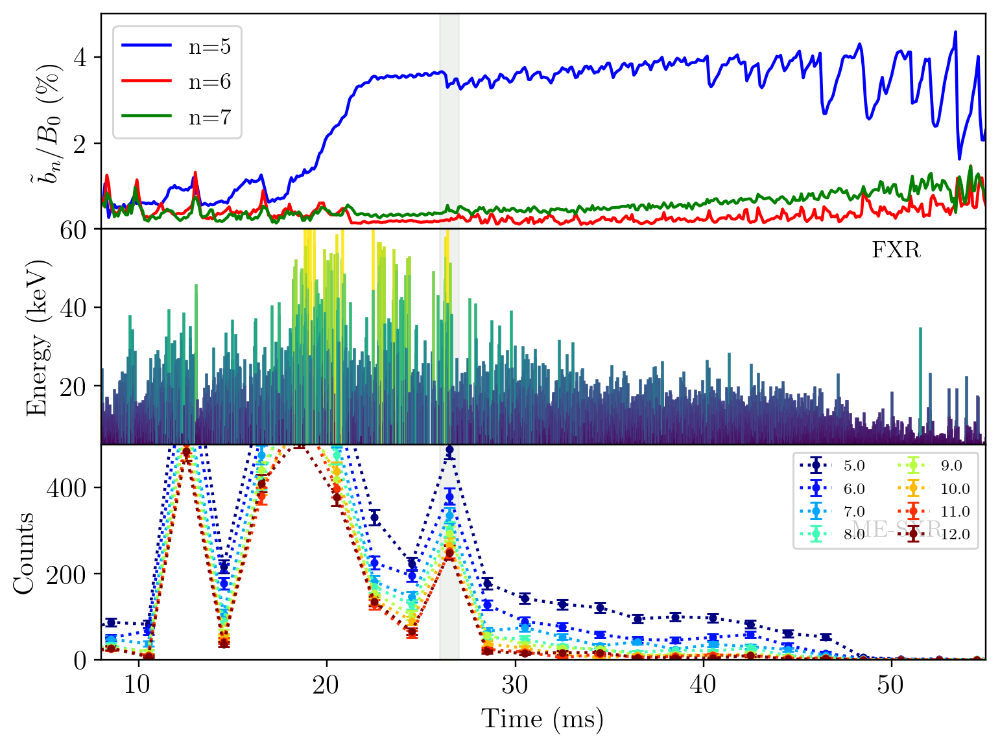

In [136]:
fig, axs = plt.subplots(3,1)
fxr_threshold = 5.0

# Magnetics signals    
b0 = np.sqrt(mags.BP['EQ']**2 + mags.BT['EQ'])
for n,color in zip([5,6,7], ['blue','red','green']):
    key = 'N{0:02d}'.format(n)
    b_n = np.sqrt(mags.BP[key]['Amplitude']**2 + mags.BT[key]['Amplitude'])
    axs[0].plot(mags.Time, b_n / b0 * 100, label='n={0:d}'.format(n), color=color)

axs[0].legend(loc='upper left')
axs[0].set_ylabel(r'$\tilde{b}_n/B_{0}$ (\%)')
axs[0].set_ylim([0,5])

# FXR signals
norm = Normalize(fxr_threshold,60)
cmap = cm.viridis

for index in range(len(fxr_time)):
    amp = fxr_energy[index]
    if amp > fxr_threshold:
        axs[1].plot([fxr_time[index],fxr_time[index]], [0,amp], '-', color=cmap(norm(amp)))

axs[1].set_ylim([fxr_threshold, 60])
axs[1].set_ylabel('Energy (keV)')
text(0.9, 0.9, 'FXR', axs[1], color='black')

# ME-SXR core
x_index = 30
cmap = cm.jet
norm = Normalize(np.amin(thresholds), np.amax(thresholds))
for Ec in thresholds:
    y =  np.maximum(profs[Ec][:,x_index],0)
    axs[2].errorbar(tiempo, y, yerr=np.sqrt(y), label='{0:.1f}'.format(Ec),
                    capsize=3, ms=3, marker='o', linestyle=':', color=cmap(norm(Ec)))
axs[2].legend(ncol=2, fontsize=8)
axs[2].set_ylabel('Counts')
axs[2].set_ylim([0,500])
text(0.9, 0.6, 'ME-SXR', axs[2], color='black')

# Format the axes
for ax in axs[:-1]:
    ax.xaxis.set_ticklabels([])

for ax in axs:
    ax.set_xlim([t_start, t_end])
    ax.axvspan(26.0, 27.0, color='xkcd:light gray', alpha=0.4)
    
axs[-1].set_xlabel('Time (ms)')
axs[-1].set_xlim([t_start, t_end])
plt.subplots_adjust(wspace=0, hspace=0);

In [323]:
shot = 1200701056
frame = 14
data = load_raw_data(shot)

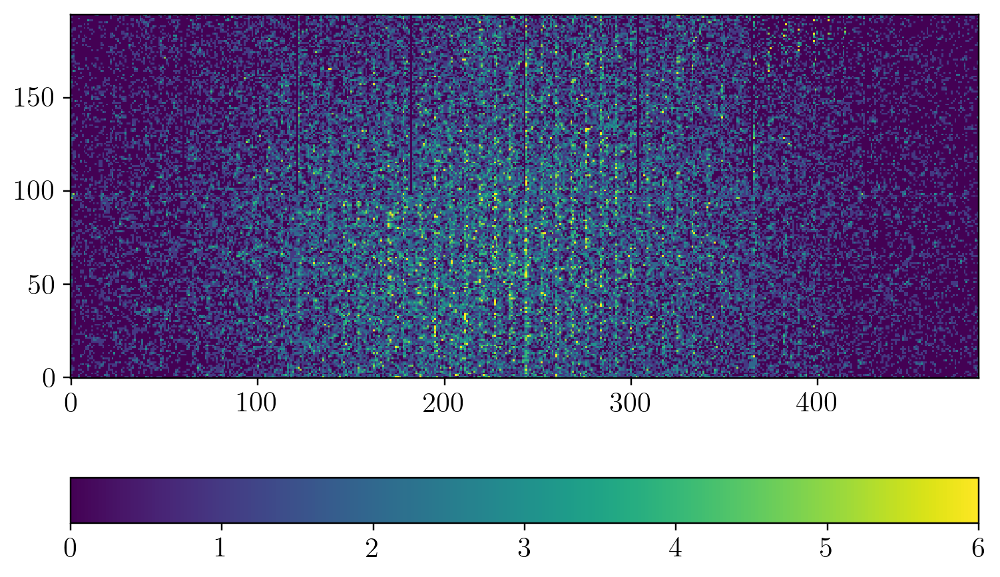

In [324]:
cax = plt.imshow(data.images[:,:,13].T, vmax=6)
plt.colorbar(cax, orientation='horizontal')

In [325]:
mesxr_data, mesxr_sigmas, signed_ps, thresholds = mesxr.get_8c_data(shot, frame, center=False)

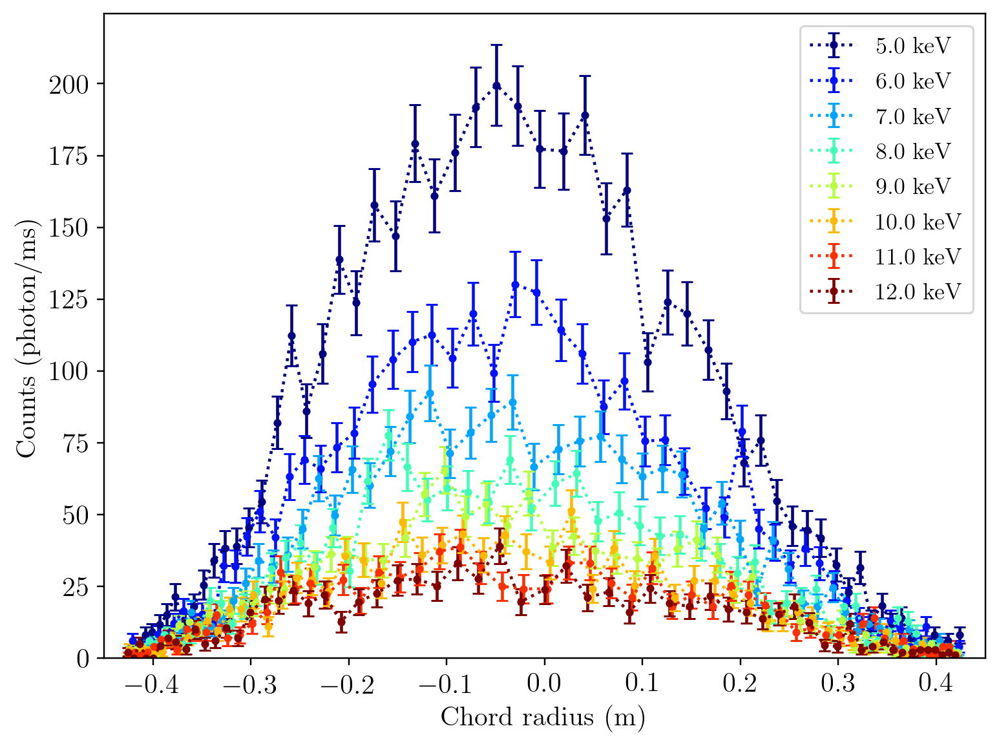

In [326]:
norm = Normalize(5,12)
cmap = cm.jet

for Ec in thresholds:
    plt.errorbar(signed_ps[Ec], mesxr_data[Ec], yerr=mesxr_sigmas[Ec], marker='o', ms=3, capsize=3, linestyle=':',
                 color=cmap(norm(Ec)), label='{0:.1f} keV'.format(Ec))
    
plt.legend()
plt.xlim([-0.45, 0.45])
plt.ylim([0,None])
plt.xlabel('Chord radius (m)')
plt.ylabel('Counts (photon/ms)');

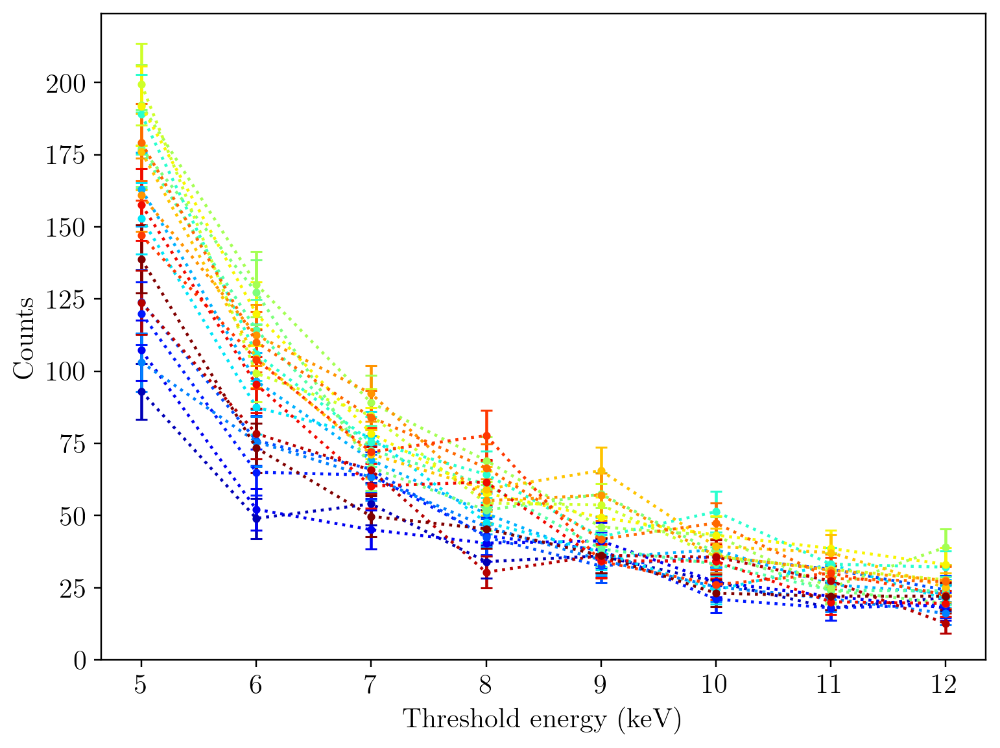

In [329]:
norm = Normalize(20,40)
cmap = cm.jet

for x_index in range(21,41):
    counts = np.array([mesxr_data[Ec][x_index] for Ec in thresholds])
    plt.errorbar(thresholds, counts, yerr=np.sqrt(counts), marker='o', ms=3, capsize=3, linestyle=':', color=cmap(norm(x_index)))

plt.xlabel('Threshold energy (keV)')
plt.ylabel('Counts')
plt.ylim([0,None]);

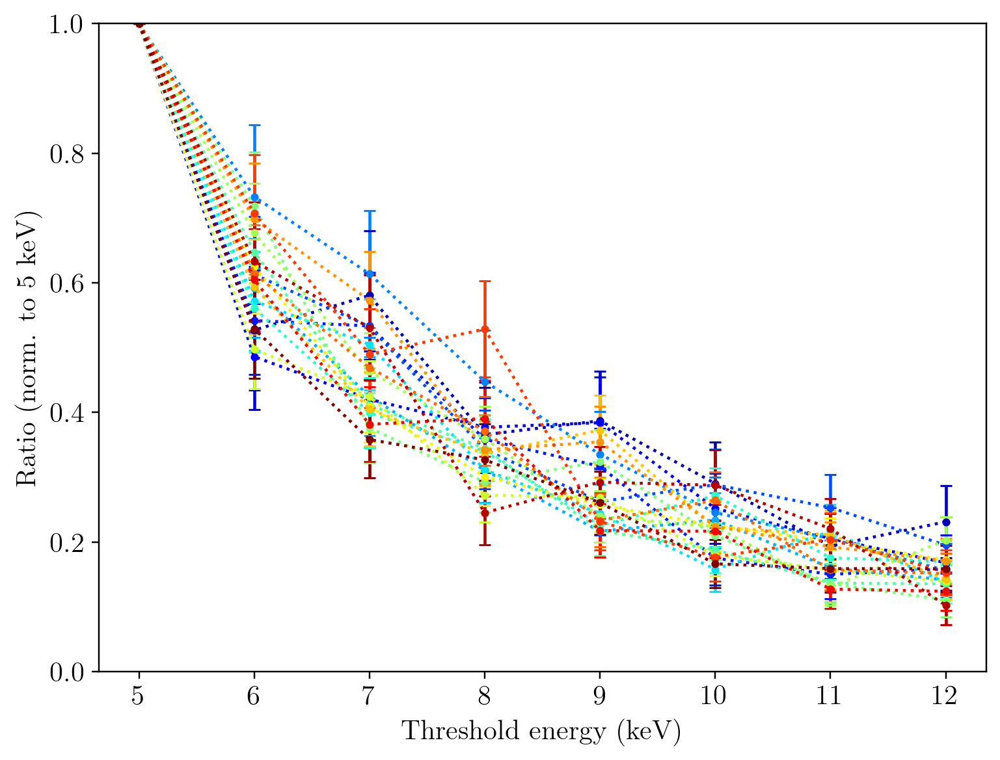

In [330]:
for x_index in range(21,41):
    counts = np.array([mesxr_data[Ec][x_index] for Ec in thresholds])
    sigmas = np.sqrt(counts)
    ratios = counts / counts[0]
    rerr = ratios*np.sqrt((sigmas/counts)**2 + (sigmas[0]/counts[0])**2)
    rerr[0] = 0
    plt.errorbar(thresholds, ratios, yerr=rerr, marker='o', ms=3, capsize=3, linestyle=':', color=cmap(norm(x_index)))
    
plt.xlabel('Threshold energy (keV)')
plt.ylabel('Ratio (norm. to 5 keV)')
plt.ylim([0,1]);

As a useful reminder, let's look at the response function for these thresholds.

In [75]:
import mst_ida.models.base.response as rsp

resp_set = {Ec:rsp.Pilatus_Response(Ec*1000., 550., charge_sharing=True) for Ec in thresholds}

Text(0, 0.5, 'Response (norm.)')

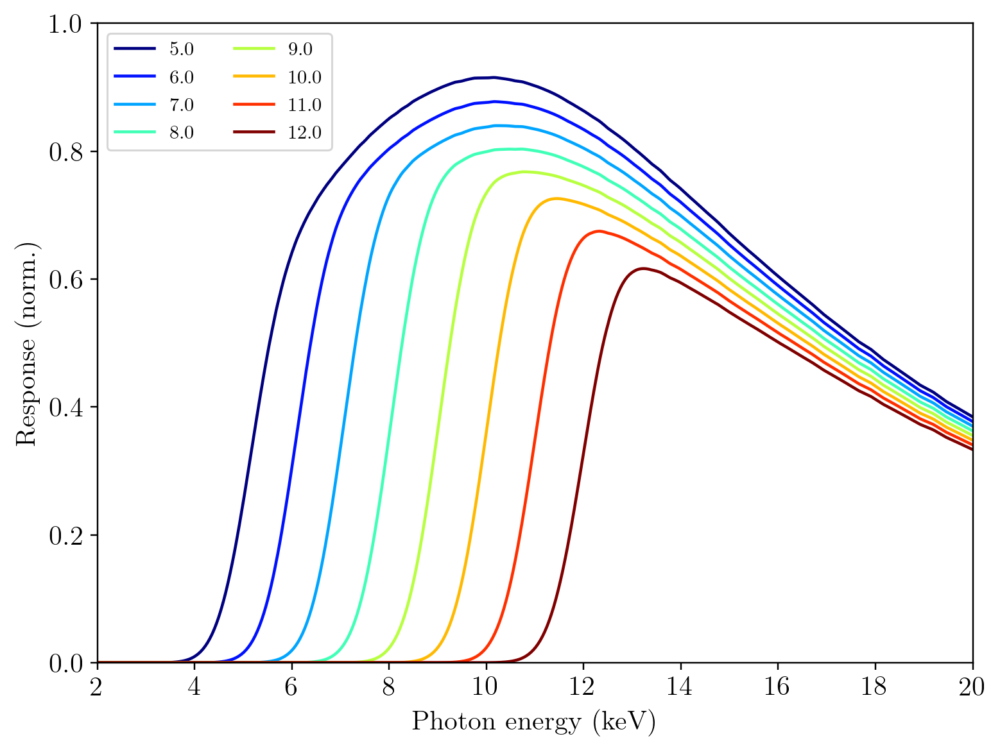

In [111]:
en = np.linspace(2000, 20000, num=500)
norm = Normalize(5,12)
cmap = cm.jet

for Ec in thresholds:
    plt.plot(en/1000., resp_set[Ec](en), color=cmap(norm(Ec)), label=Ec)
    
plt.legend(loc='upper left', ncol=2, fontsize=10)
plt.xlim([2, 20])
plt.ylim([0,1])
plt.xlabel('Photon energy (keV)')
plt.ylabel('Response (norm.)')

If we assume that the runaways follow a power-law distribution:

$$
    \varepsilon(E) \propto E^{-\gamma}
$$

This means that the integrated signal is given by:

$$
    N(\gamma;E_c) \propto \int_{0}^{\infty} R(E;E_c) E^{-\gamma} dE
$$

In [91]:
en = np.linspace(2000, 30000, num=1500)

def counts_model(gamma, Ec=5.0):
    return np.trapz(resp_set[Ec](en)*en**(-gamma), x=en)

def ratio_model(gamma, ref=5.0):
    counts = np.array([counts_model(gamma, Ec=Ec) for Ec in thresholds])
    return counts / counts[0]

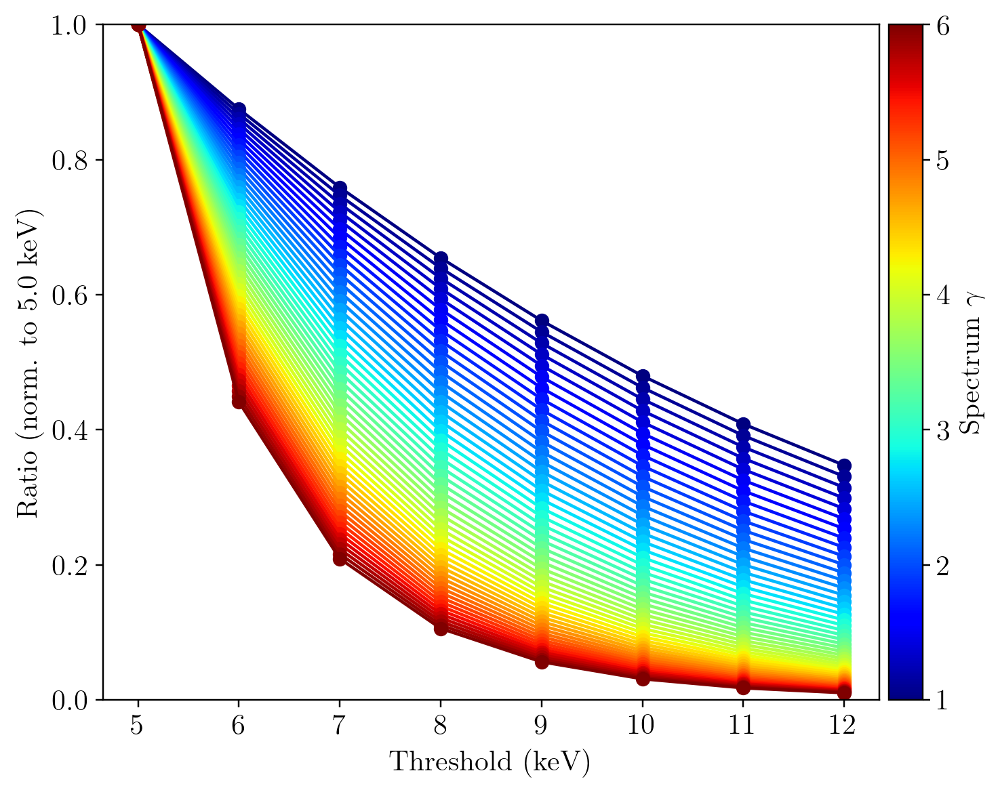

In [109]:
import matplotlib as mpl

gammas = np.linspace(1, 6, num=50)
norm = Normalize(gammas[0], gammas[-1])
cmap = cm.jet

for gamma in gammas:
    plt.plot(thresholds, ratio_model(gamma), '-o', color=cmap(norm(gamma)))
    
cbar = plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), pad=0.01, label=r'Spectrum $\gamma$')
plt.xlabel('Threshold (keV)')
plt.ylabel('Ratio (norm. to 5.0 keV)')
plt.ylim([0,1]);

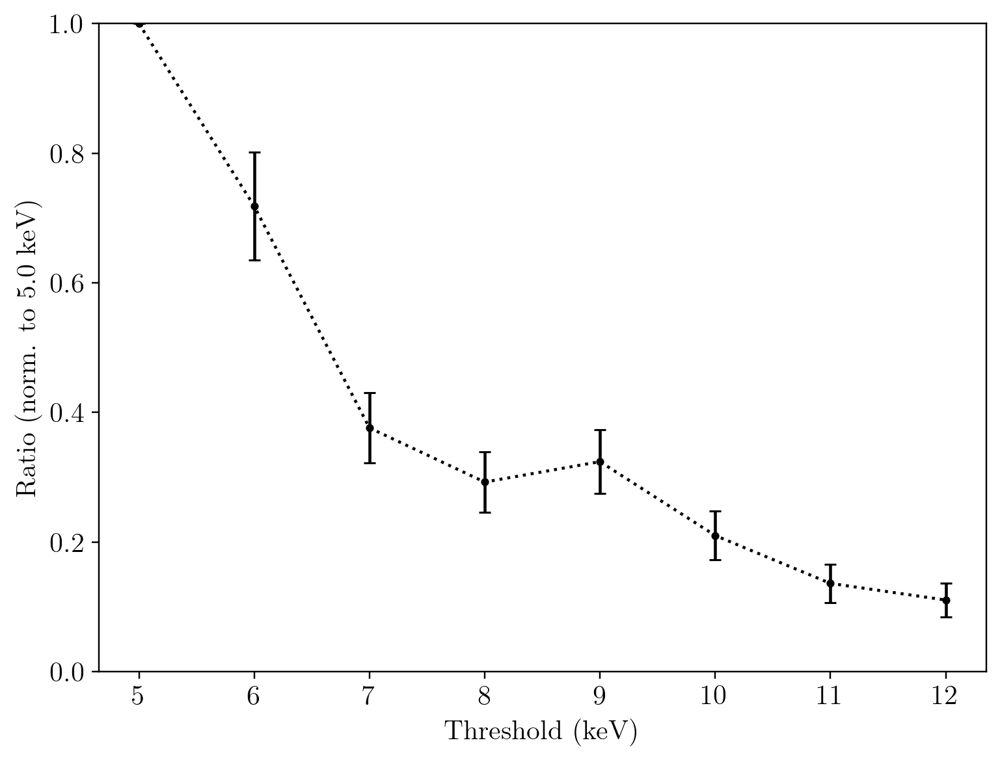

In [134]:
x_index = 30
counts = np.array([mesxr_data[Ec][x_index] for Ec in thresholds])
sigmas = np.sqrt(counts)
ratios = counts / counts[0]
rerr = ratios*np.sqrt((sigmas/counts)**2 + (sigmas[0]/counts[0])**2)
rerr[0] = 0

plt.errorbar(thresholds, ratios, yerr=rerr, marker='o', ms=3, capsize=3, linestyle=':', color='black')
plt.xlabel('Threshold (keV)')
plt.ylabel('Ratio (norm. to 5.0 keV)')
plt.ylim([0,1]);

In [137]:
gammas = np.linspace(1, 6, num=200)
chi2 = np.zeros(gammas.shape)
for i,gamma in enumerate(gammas):
    model = ratio_model(gamma)
    chi2[i] = np.sum((model[1:] - ratios[1:])**2 / rerr[1:]**2)
    
prob = np.exp(-0.5*chi2)
Z = np.trapz(prob, x=gammas)
pdf = prob / Z

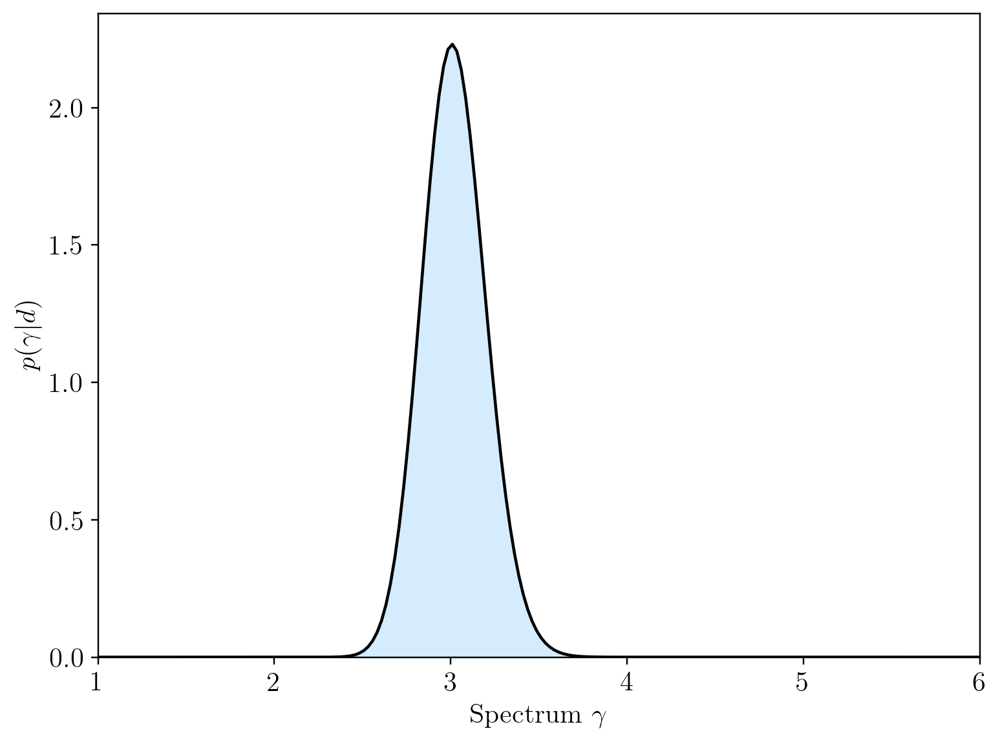

In [139]:
plt.plot(gammas, pdf, color='black')
plt.fill_between(gammas, pdf, color='xkcd:light blue', alpha=0.4)

plt.xlim([1,6])
plt.ylim([0,None])
plt.xlabel(r'Spectrum $\gamma$')
plt.ylabel(r'$p(\gamma|d)$');

In [140]:
cdf = sp.integrate.cumtrapz(pdf, x=gammas, initial=0.0)

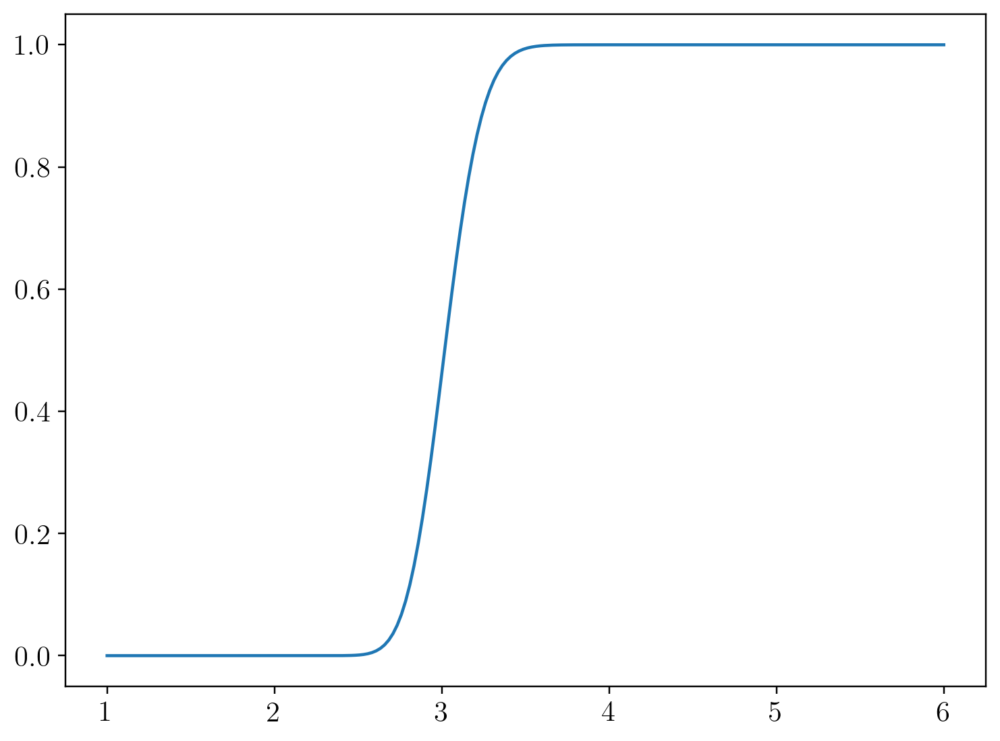

In [141]:
plt.plot(gammas, cdf)

median = gammas[np.argmin(cdf - 0.5)]

In [144]:
from mst_ida.analysis.samplers import Quad_Sampler

def ln_likelihood(gamma):
    model = ratio_model(gamma)
    return -0.5*np.sum((model[1:] - ratios[1:])**2 / rerr[1:]**2)

priors = [1,6]
sampler = Quad_Sampler(ln_likelihood, priors)
sampler.fit()

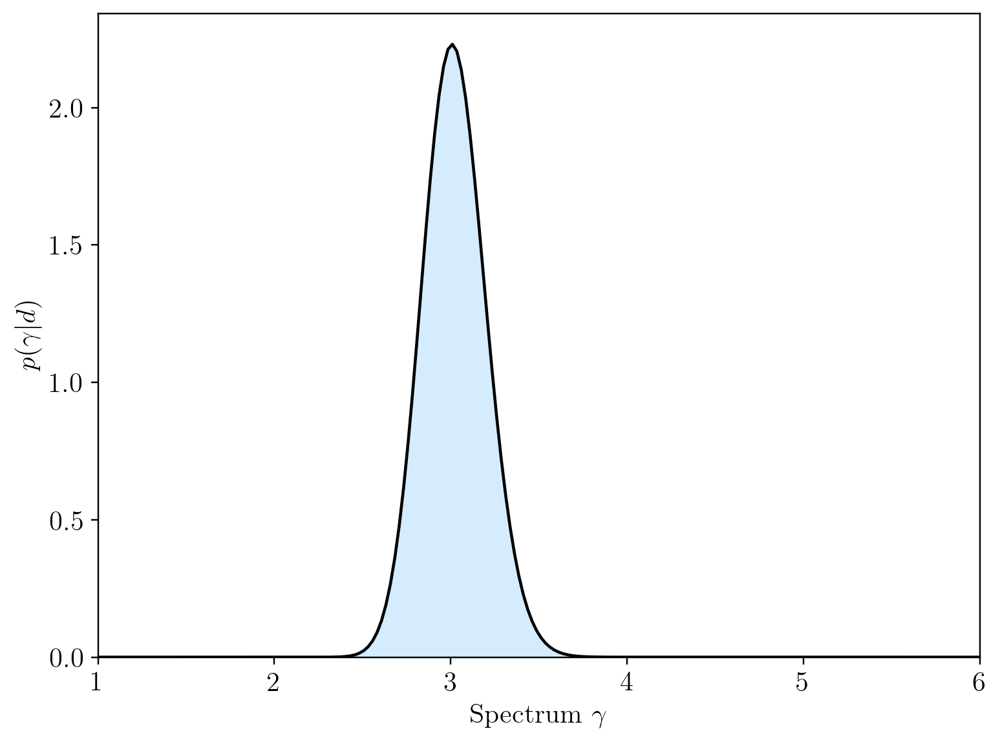

In [146]:
plt.plot(sampler.xs, sampler.pdf, color='black')
plt.fill_between(sampler.xs, sampler.pdf, color='xkcd:light blue', alpha=0.4)

plt.xlim([1,6])
plt.ylim([0,None])
plt.xlabel(r'Spectrum $\gamma$')
plt.ylabel(r'$p(\gamma|d)$');

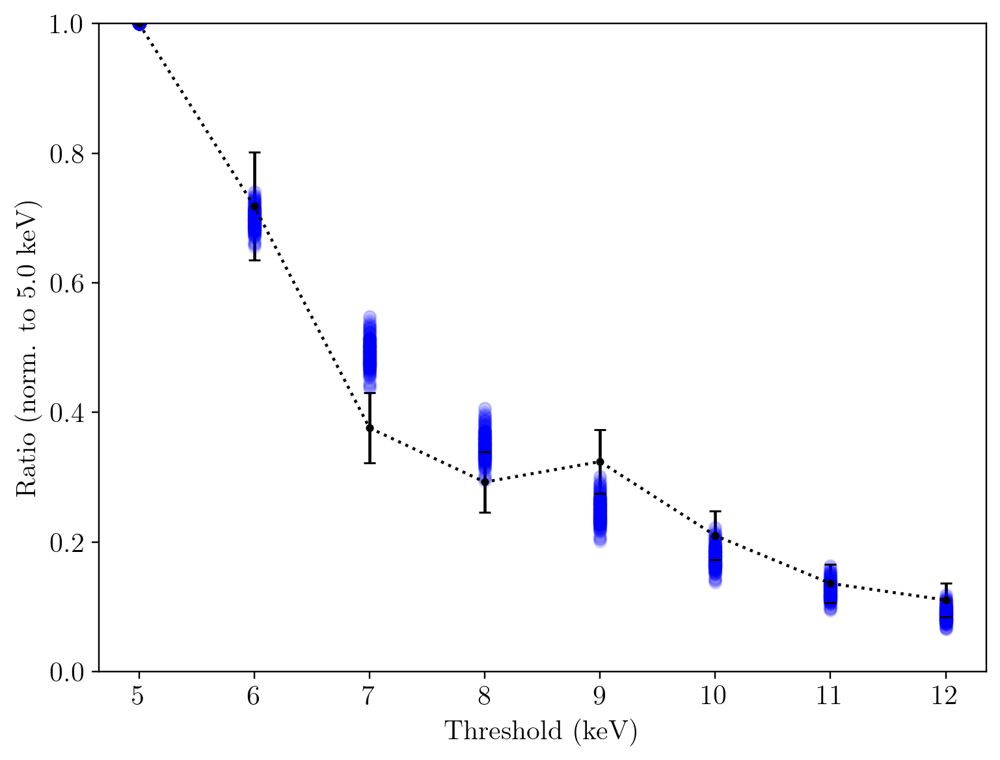

In [160]:
for gamma in sampler.get_samples(200):
    plt.plot(thresholds, ratio_model(gamma), 'o', color='blue', alpha=0.1)

plt.errorbar(thresholds, ratios, yerr=rerr, marker='o', ms=3, capsize=3, linestyle=':', color='black')
plt.xlabel('Threshold (keV)')
plt.ylabel('Ratio (norm. to 5.0 keV)')
plt.ylim([0,1]);

In [182]:
# Settings
priors = [1,5]
x_indices = np.arange(8, 53)

# Containers
ps = np.array([np.average([signed_ps[Ec][xi] for Ec in thresholds]) for xi in x_indices])
gammas = np.zeros(x_indices.shape)
gamma_errs = np.zeros(x_indices.shape)

for i,x_index in enumerate(tqdm(x_indices)):
    # Get the ratio data
    counts = np.array([mesxr_data[Ec][x_index] for Ec in thresholds])
    sigmas = np.array([mesxr_sigmas[Ec][x_index] for Ec in thresholds])
    ratios = counts / counts[0]
    rerr = ratios*np.sqrt((sigmas/counts)**2 + (sigmas[0]/counts[0])**2)
    rerr[0] = 0
    
    # Load the sampler
    ln_likelihood = lambda gamma: -0.5*np.sum((ratio_model(gamma)[1:] - ratios[1:])**2 / rerr[1:]**2)
    sampler = Quad_Sampler(ln_likelihood, priors)
    sampler.fit()
    
    # Store the results
    gammas[i] = sampler.mean
    gamma_errs[i] = sampler.std

100%|██████████| 45/45 [00:31<00:00,  1.44it/s]


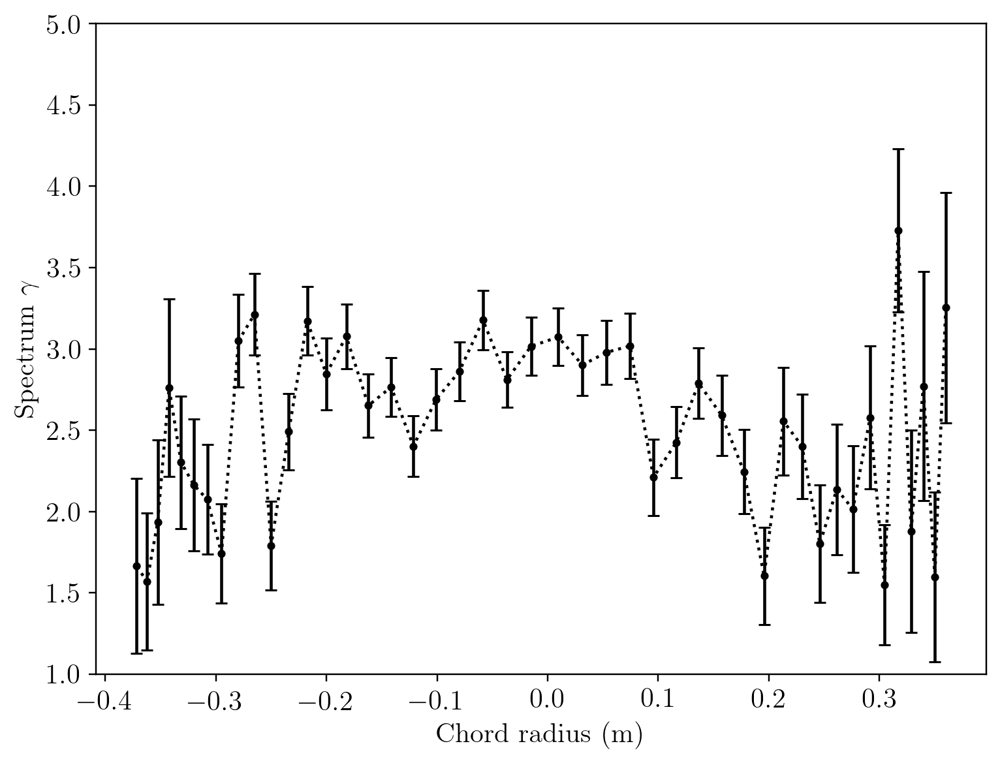

In [184]:
plt.errorbar(ps, gammas, yerr=gamma_errs, ms=3, capsize=3, marker='o', linestyle=':', color='black')
plt.xlabel('Chord radius (m)')
plt.ylabel(r'Spectrum $\gamma$')
plt.ylim(priors);

 Now let's package this for further automation!

In [222]:
import mst_ida.data.mesxr as mesxr
from mst_ida.analysis.samplers import Quad_Sampler
from mst_ida.utilities.structures import AttrDict

def fit_gammas(shot, frame, priors=[1,7], x_indices=np.arange(10, 51), quiet=False):
    # Load in the shot data
    mesxr_data, mesxr_sigmas, signed_ps, thresholds = mesxr.get_8c_data(shot, frame, center=False)

    # Containers
    ps = np.array([np.average([signed_ps[Ec][xi] for Ec in thresholds]) for xi in x_indices])
    gammas = np.zeros(x_indices.shape)
    gamma_errs = np.zeros(x_indices.shape)

    for i,x_index in enumerate(tqdm(x_indices, disable=quiet)):
        # Get the ratio data
        counts = np.array([mesxr_data[Ec][x_index] for Ec in thresholds])
        sigmas = np.array([mesxr_sigmas[Ec][x_index] for Ec in thresholds])
        ratios = counts / counts[0]
        rerr = ratios*np.sqrt((sigmas/counts)**2 + (sigmas[0]/counts[0])**2)
        rerr[0] = 0

        # Load the sampler
        ln_likelihood = lambda gamma: -0.5*np.sum((ratio_model(gamma)[1:] - ratios[1:])**2 / rerr[1:]**2)
        sampler = Quad_Sampler(ln_likelihood, priors)
        sampler.fit()

        # Store the results
        gammas[i] = sampler.mean
        gamma_errs[i] = sampler.std
        
    # Package the results
    data = {
        'data':mesxr_data,
        'sigmas':mesxr_sigmas,
        'ps':signed_ps,
        'xs':x_indices
    }
    
    results = {
        'gamma':gammas,
        'err':gamma_errs,
        'p':ps,
        'thresholds':thresholds,
        'mesxr':data
    }
        
    return AttrDict(results)

In [198]:
shot = 1200701056
frame = 13

res = fit_gammas(shot, frame)

100%|██████████| 41/41 [00:28<00:00,  1.42it/s]


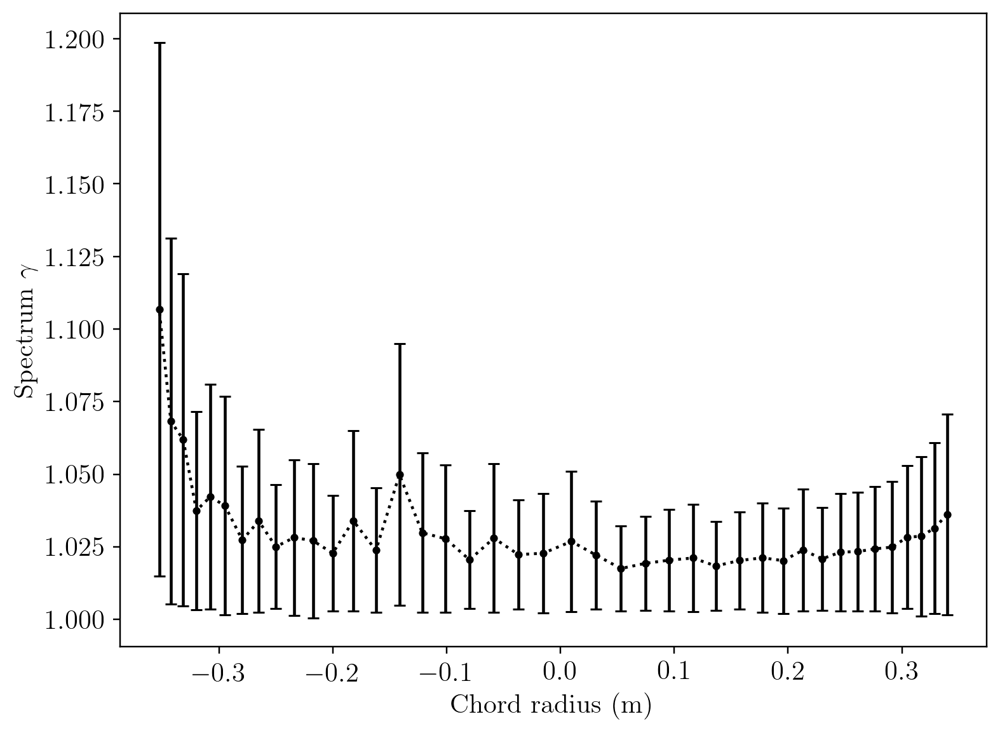

In [199]:
plt.errorbar(res.p, res.gamma, yerr=res.err, ms=3, capsize=3, marker='o', linestyle=':', color='black')
plt.xlabel('Chord radius (m)')
plt.ylabel(r'Spectrum $\gamma$');

In [278]:
shot = 1200701056
frames = np.arange(6, 24)
priors = [-2,7]
results = []

for frame in tqdm(frames):
    results.append(fit_gammas(shot, frame, quiet=True, priors=priors))

 67%|██████▋   | 12/18 [06:02<03:01, 30.23s/it]/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in true_divide
/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in multiply
 94%|█████████▍| 17/18 [08:32<00:30, 30.12s/it]/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide
/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in double_scalars
/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide
100%|██████████| 18/18 [09:03<00:00, 30.18s/it]


In [279]:
x_indices=np.arange(10, 51)
times = 2*frames + 0.5
gammas = np.zeros([len(frames), len(x_indices)])
sigmas = np.zeros([len(frames), len(x_indices)])

for index in range(len(frames)):
    gammas[index,:] = results[index].gamma
    sigmas[index,:] = results[index].err
    nan_indices = np.where(np.isnan(gammas[index,:]))[0]
    gammas[index,nan_indices] = 7.0

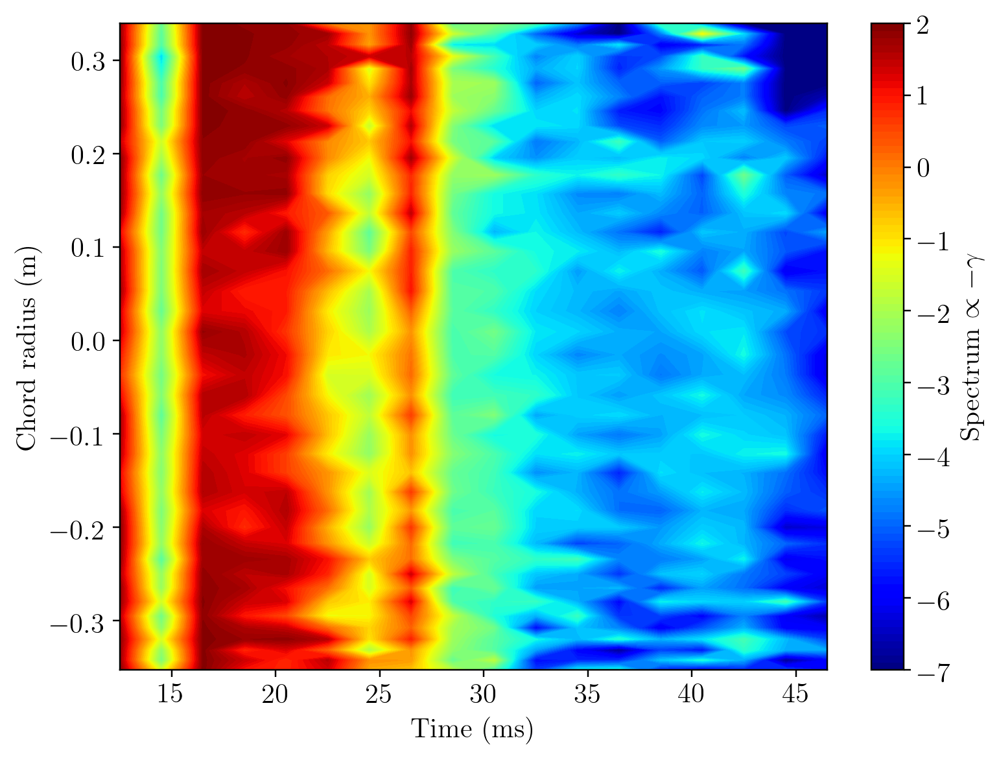

In [285]:
cax = plt.contourf(times, results[0].p, -gammas.T, 100, cmap=cm.jet, vmin=-7, vmax=2)
plt.xlabel('Time (ms)')
plt.ylabel('Chord radius (m)')
plt.colorbar(cax, label=r'Spectrum $\propto -\gamma$');

In [281]:
# Average across the radius
N = len(gammas[0, 10:-11])
gam_avg = np.array([np.average(gammas[index, 10:-11]) for index in range(len(frames))])
gam_err = np.array([np.sqrt(np.sum(sigmas[index,10:-11]**2))/N for index in range(len(frames))])

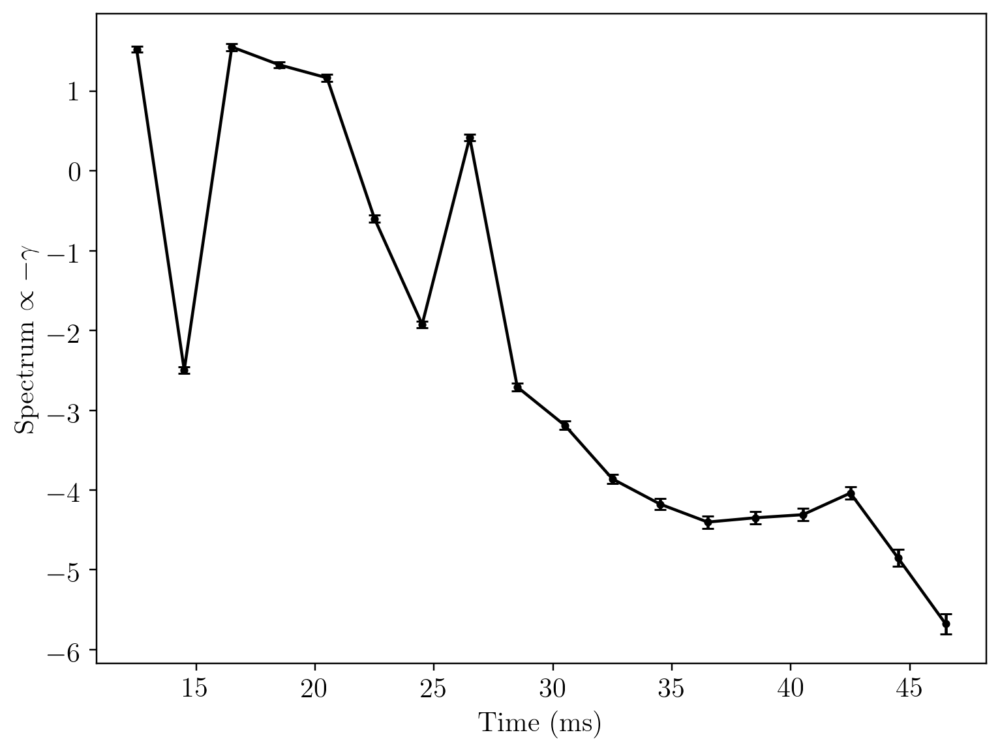

In [282]:
plt.errorbar(times, -gam_avg, yerr=gam_err, marker='o', ms=3, capsize=3, color='black', linestyle='-')
plt.ylabel(r'Spectrum $\propto -\gamma$')
plt.xlabel('Time (ms)');

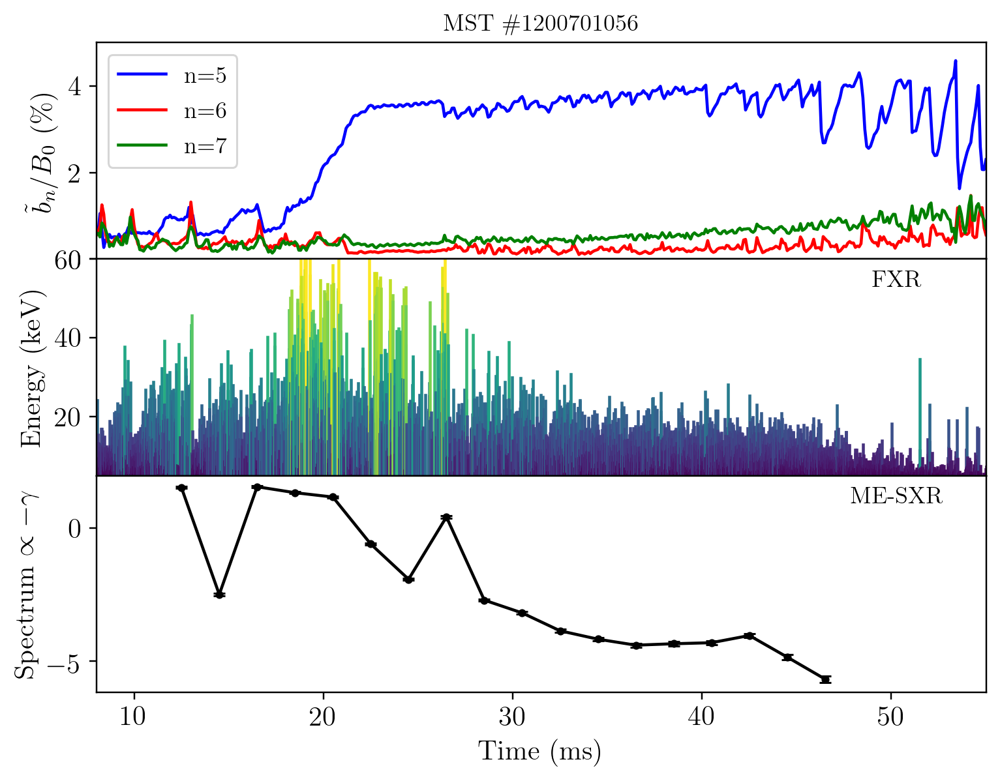

In [286]:
fig, axs = plt.subplots(3,1)
fxr_threshold = 5.0

# Magnetics signals    
b0 = np.sqrt(mags.BP['EQ']**2 + mags.BT['EQ'])
for n,color in zip([5,6,7], ['blue','red','green']):
    key = 'N{0:02d}'.format(n)
    b_n = np.sqrt(mags.BP[key]['Amplitude']**2 + mags.BT[key]['Amplitude'])
    axs[0].plot(mags.Time, b_n / b0 * 100, label='n={0:d}'.format(n), color=color)

axs[0].legend(loc='upper left')
axs[0].set_ylabel(r'$\tilde{b}_n/B_{0}$ (\%)')
axs[0].set_ylim([0,5])

# FXR signals
norm = Normalize(fxr_threshold,60)
cmap = cm.viridis

for index in range(len(fxr_time)):
    amp = fxr_energy[index]
    if amp > fxr_threshold:
        axs[1].plot([fxr_time[index],fxr_time[index]], [0,amp], '-', color=cmap(norm(amp)))

axs[1].set_ylim([fxr_threshold, 60])
axs[1].set_ylabel('Energy (keV)')
text(0.9, 0.9, 'FXR', axs[1], color='black')

# ME-SXR core
axs[2].errorbar(times, -gam_avg, yerr=gam_err, marker='o', ms=3, capsize=3, color='black', linestyle='-')
axs[2].set_ylabel(r'Spectrum $\propto -\gamma$')
text(0.9, 0.9, 'ME-SXR', axs[2], color='black')

# Format the axes
for ax in axs[:-1]:
    ax.xaxis.set_ticklabels([])

for ax in axs:
    ax.set_xlim([t_start, t_end])
    #ax.axvspan(26.0, 27.0, color='xkcd:light gray', alpha=0.4)
    
axs[-1].set_xlabel('Time (ms)')
axs[-1].set_xlim([t_start, t_end])
plt.subplots_adjust(wspace=0, hspace=0)
axs[0].set_title(r'MST \#{0:10d}'.format(shot));

## How well do the saturated $\gamma \approx 1$ points actually fit?

In [331]:
shot = 1200701056
frame = 13
mesxr_data, mesxr_sigmas, signed_ps, thresholds = mesxr.get_8c_data(shot, frame, center=False)

# Format the data as ratios
x_index = 30
priors=[-2,7]
counts = np.array([mesxr_data[Ec][x_index] for Ec in thresholds])
sigmas = np.array([mesxr_sigmas[Ec][x_index] for Ec in thresholds])
ratios = counts / counts[0]
rerr = ratios*np.sqrt((sigmas/counts)**2 + (sigmas[0]/counts[0])**2)
rerr[0] = 0

# Load the sampler
ln_likelihood = lambda gamma: -0.5*np.sum((ratio_model(gamma)[1:] - ratios[1:])**2 / rerr[1:]**2)
sampler = Quad_Sampler(ln_likelihood, priors)
sampler.fit()

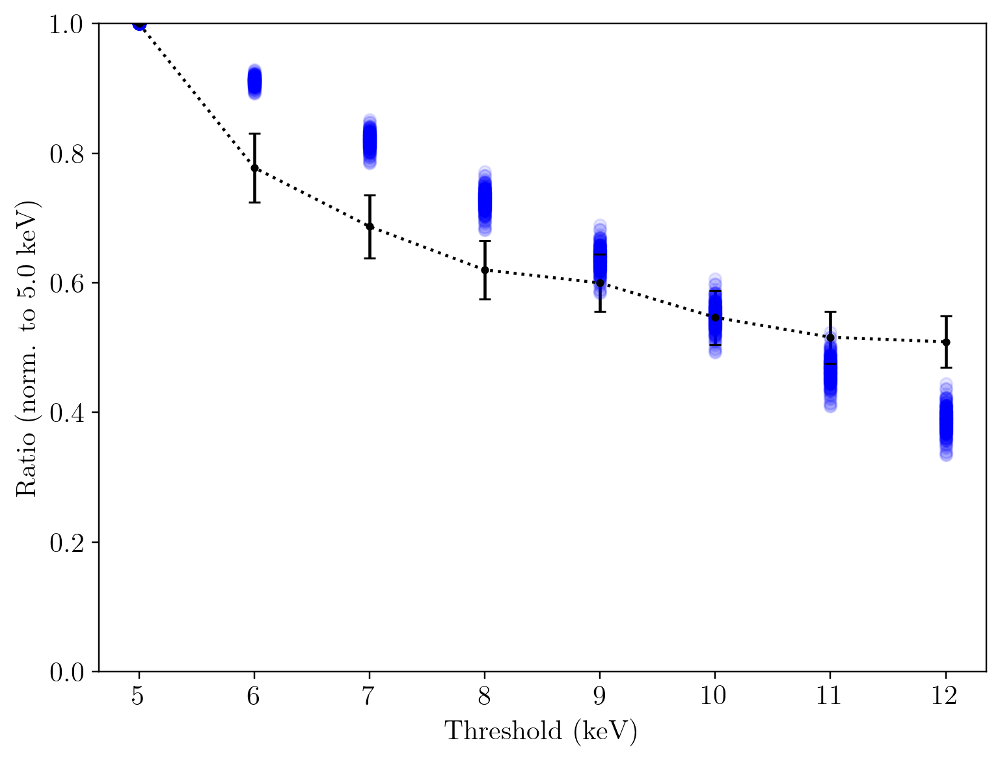

In [332]:
for gamma in sampler.get_samples(200):
    plt.plot(thresholds, ratio_model(gamma), 'o', color='blue', alpha=0.1)
    
plt.errorbar(thresholds, ratios, yerr=rerr, marker='o', ms=3, capsize=3, linestyle=':', color='black')
plt.xlabel('Threshold (keV)')
plt.ylabel('Ratio (norm. to 5.0 keV)')
plt.ylim([0,1]);

In [304]:
sampler.mean

-1.0949049329391316

This fit is clearly not perfect, meaning that the $\varepsilon \propto E^{-\gamma}$ model is does not describe this phenomenon well. However for most of the remining data points this description is decent.

## Look at another shot ($n_e \sim 0.4$)

In [287]:
shot = 1200701053
frames = np.arange(6, 24)

# Fit the data
priors = [-2,7]
results = []

for frame in tqdm(frames):
    results.append(fit_gammas(shot, frame, quiet=True, priors=priors))
    
# Sort into the time series
x_indices=np.arange(10, 51)
times = 2*frames + 0.5
gammas = np.zeros([len(frames), len(x_indices)])
sigmas = np.zeros([len(frames), len(x_indices)])

for index in range(len(frames)):
    gammas[index,:] = results[index].gamma
    sigmas[index,:] = results[index].err
    nan_indices = np.where(np.isnan(gammas[index,:]))[0]
    gammas[index,nan_indices] = 7.0

 56%|█████▌    | 10/18 [05:01<04:01, 30.15s/it]/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in true_divide
/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in multiply
100%|██████████| 18/18 [09:01<00:00, 30.10s/it]


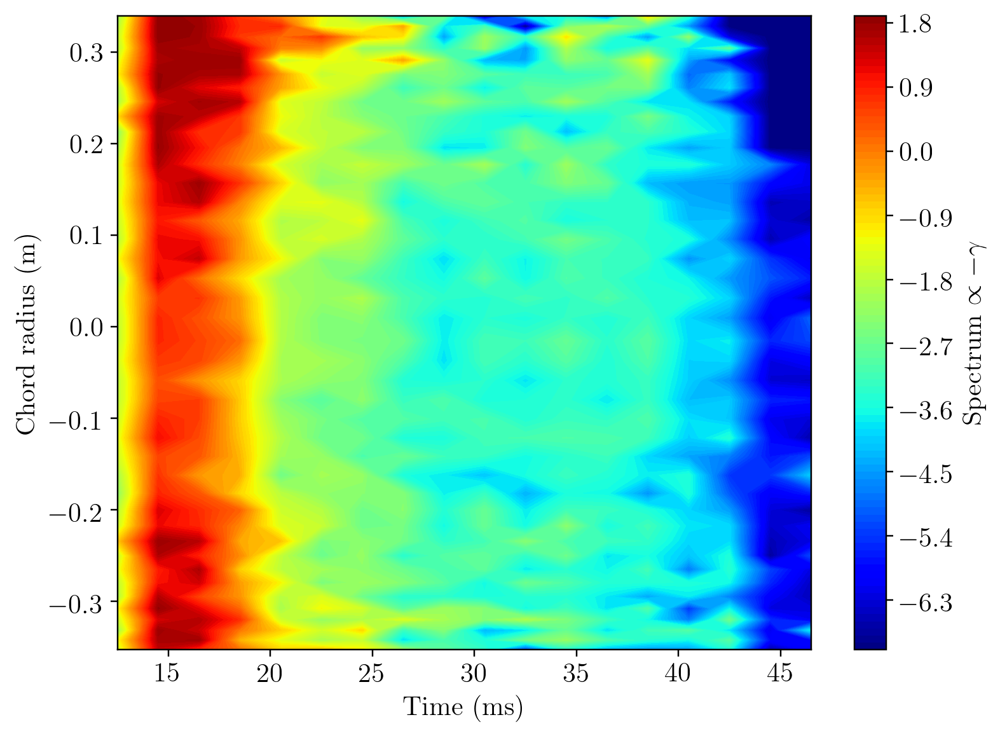

In [288]:
cax = plt.contourf(times, results[0].p, -gammas.T, 100, cmap=cm.jet, vmin=-7, vmax=2)
plt.xlabel('Time (ms)')
plt.ylabel('Chord radius (m)')
plt.colorbar(cax, label=r'Spectrum $\propto -\gamma$');

In [289]:
# Average across the radius
N = len(gammas[0, 10:-11])
gam_avg = np.array([np.average(gammas[index, 10:-11]) for index in range(len(frames))])
gam_err = np.array([np.sqrt(np.sum(sigmas[index,10:-11]**2))/N for index in range(len(frames))])

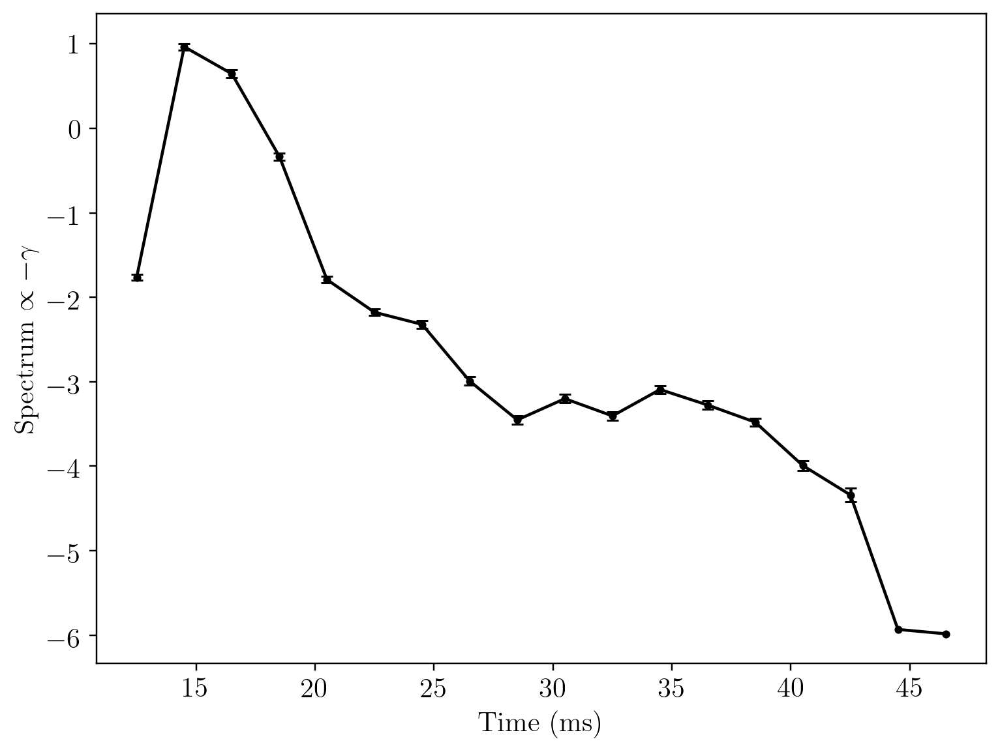

In [290]:
plt.errorbar(times, -gam_avg, yerr=gam_err, marker='o', ms=3, capsize=3, color='black', linestyle='-')
plt.ylabel(r'Spectrum $\propto -\gamma$')
plt.xlabel('Time (ms)');

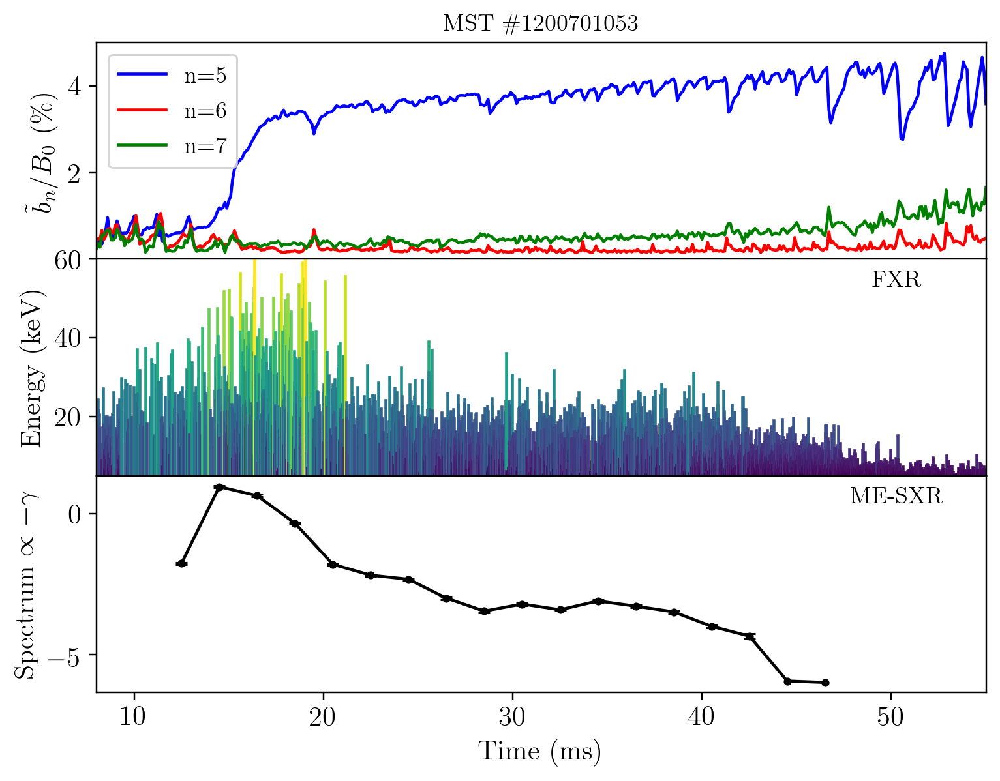

In [291]:
fig, axs = plt.subplots(3,1)
fxr_threshold = 5.0

# Load in the shot data
mags = ops.get_magnetics(shot, t_start=t_start, t_end=t_end, delta_t=delta_t, modes=np.arange(1,16))
fxr_energy, fxr_time = get_fxr_data(shot)

# Magnetics signals    
b0 = np.sqrt(mags.BP['EQ']**2 + mags.BT['EQ'])
for n,color in zip([5,6,7], ['blue','red','green']):
    key = 'N{0:02d}'.format(n)
    b_n = np.sqrt(mags.BP[key]['Amplitude']**2 + mags.BT[key]['Amplitude'])
    axs[0].plot(mags.Time, b_n / b0 * 100, label='n={0:d}'.format(n), color=color)

axs[0].legend(loc='upper left')
axs[0].set_ylabel(r'$\tilde{b}_n/B_{0}$ (\%)')
axs[0].set_ylim([0,5])

# FXR signals
norm = Normalize(fxr_threshold,60)
cmap = cm.viridis

for index in range(len(fxr_time)):
    amp = fxr_energy[index]
    if amp > fxr_threshold:
        axs[1].plot([fxr_time[index],fxr_time[index]], [0,amp], '-', color=cmap(norm(amp)))

axs[1].set_ylim([fxr_threshold, 60])
axs[1].set_ylabel('Energy (keV)')
text(0.9, 0.9, 'FXR', axs[1], color='black')

# ME-SXR core
axs[2].errorbar(times, -gam_avg, yerr=gam_err, marker='o', ms=3, capsize=3, color='black', linestyle='-')
axs[2].set_ylabel(r'Spectrum $\propto -\gamma$')
text(0.9, 0.9, 'ME-SXR', axs[2], color='black')

# Format the axes
for ax in axs[:-1]:
    ax.xaxis.set_ticklabels([])

for ax in axs:
    ax.set_xlim([t_start, t_end])
    #ax.axvspan(26.0, 27.0, color='xkcd:light gray', alpha=0.4)
    
axs[-1].set_xlabel('Time (ms)')
axs[-1].set_xlim([t_start, t_end])
plt.subplots_adjust(wspace=0, hspace=0)
axs[0].set_title(r'MST \#{0:10d}'.format(shot));

## A higher density shot ($n_e \sim 0.6$)

In [292]:
shot = 1200701037
frames = np.arange(6, 24)

# Fit the data
priors = [-2,7]
results = []

for frame in tqdm(frames):
    results.append(fit_gammas(shot, frame, quiet=True, priors=priors))
    
# Sort into the time series
x_indices=np.arange(10, 51)
times = 2*frames + 0.5
gammas = np.zeros([len(frames), len(x_indices)])
sigmas = np.zeros([len(frames), len(x_indices)])

for index in range(len(frames)):
    gammas[index,:] = results[index].gamma
    sigmas[index,:] = results[index].err
    nan_indices = np.where(np.isnan(gammas[index,:]))[0]
    gammas[index,nan_indices] = 7.0

 50%|█████     | 9/18 [04:32<04:31, 30.15s/it]/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in true_divide
/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in multiply
 67%|██████▋   | 12/18 [06:03<03:01, 30.24s/it]/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide
/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in double_scalars
/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide
100%|██████████| 18/18 [09:04<00:00, 30.24s/it]


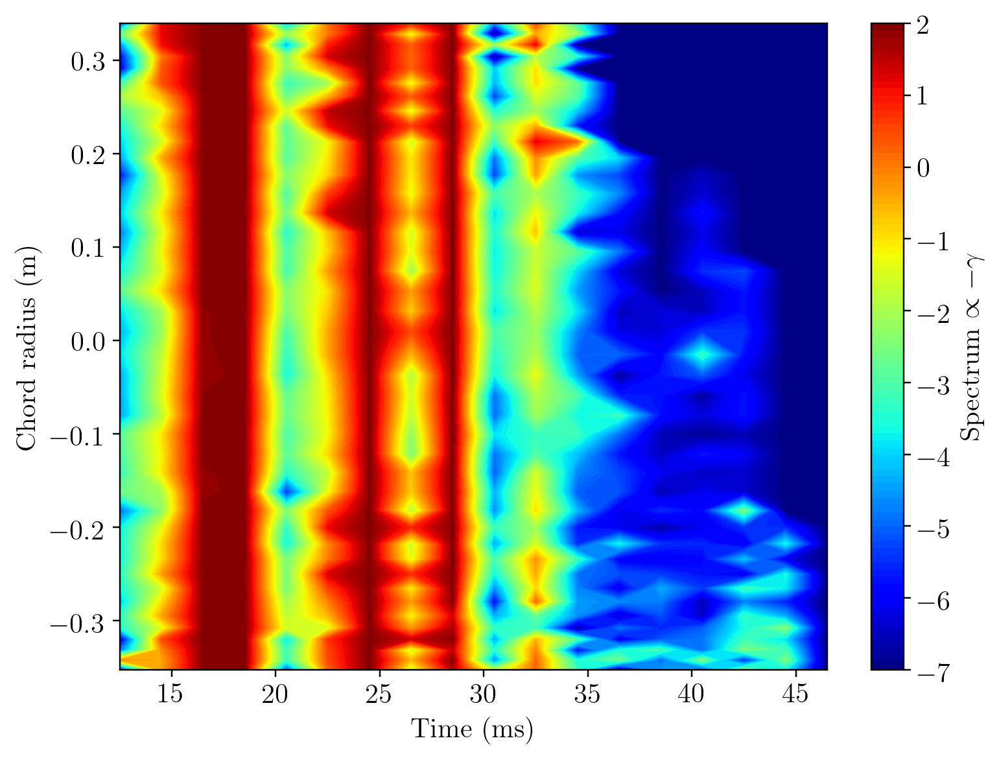

In [293]:
cax = plt.contourf(times, results[0].p, -gammas.T, 100, cmap=cm.jet, vmin=-7, vmax=2)
plt.xlabel('Time (ms)')
plt.ylabel('Chord radius (m)')
plt.colorbar(cax, label=r'Spectrum $\propto -\gamma$');

In [294]:
# Average across the radius
N = len(gammas[0, 10:-11])
gam_avg = np.array([np.average(gammas[index, 10:-11]) for index in range(len(frames))])
gam_err = np.array([np.sqrt(np.sum(sigmas[index,10:-11]**2))/N for index in range(len(frames))])

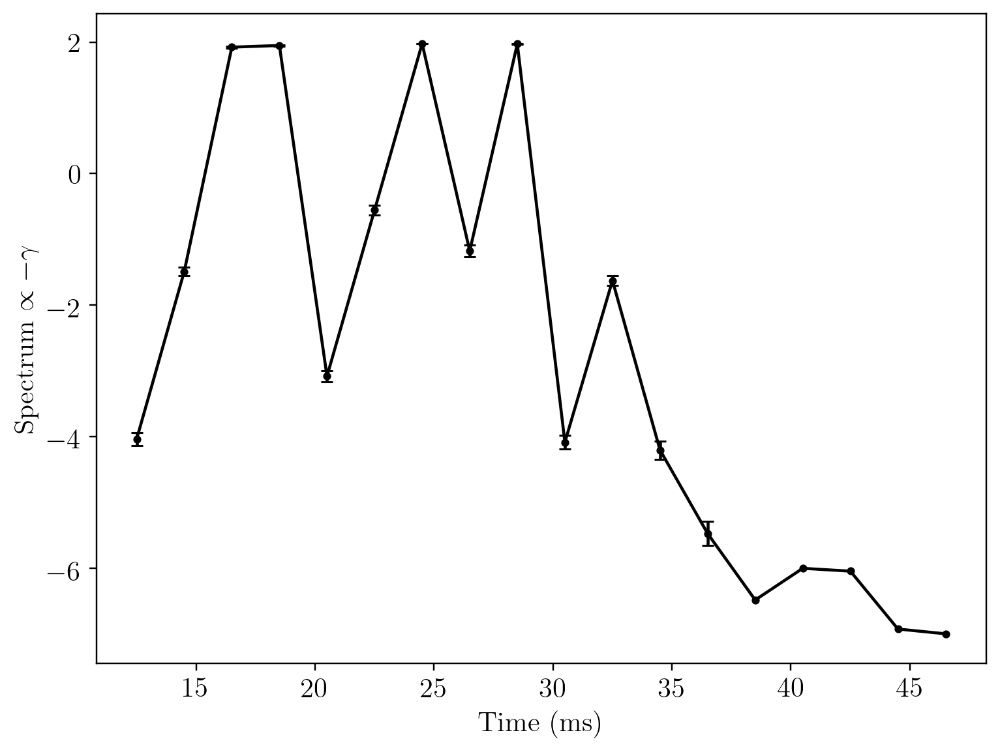

In [295]:
plt.errorbar(times, -gam_avg, yerr=gam_err, marker='o', ms=3, capsize=3, color='black', linestyle='-')
plt.ylabel(r'Spectrum $\propto -\gamma$')
plt.xlabel('Time (ms)');

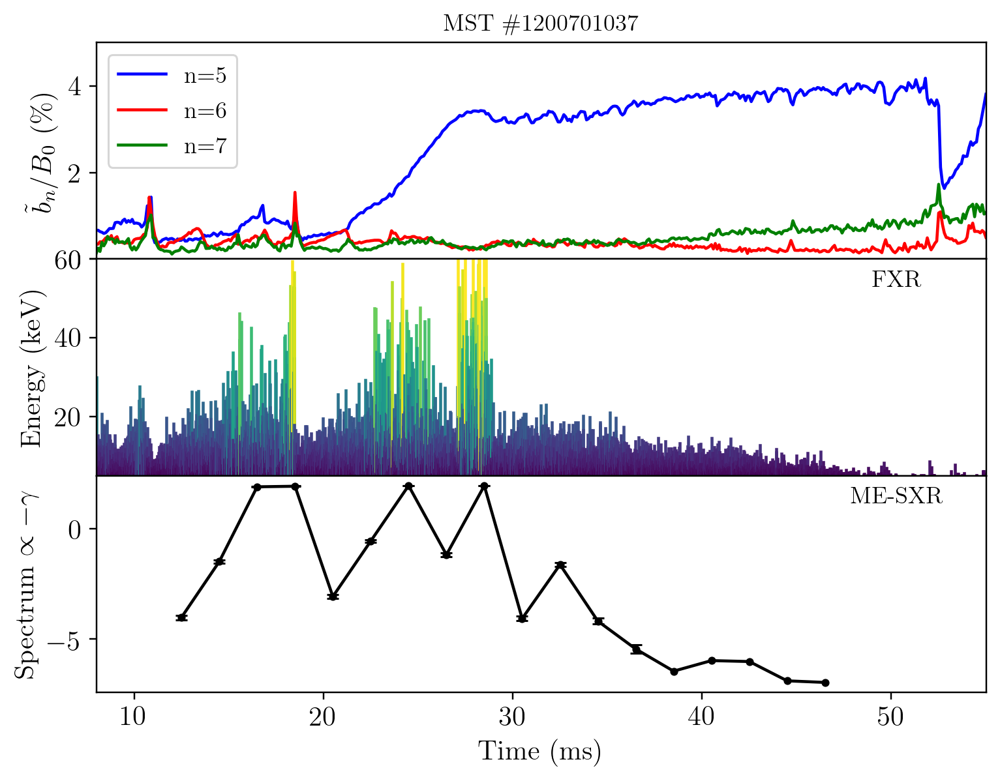

In [296]:
fig, axs = plt.subplots(3,1)
fxr_threshold = 5.0

# Load in the shot data
mags = ops.get_magnetics(shot, t_start=t_start, t_end=t_end, delta_t=delta_t, modes=np.arange(1,16))
fxr_energy, fxr_time = get_fxr_data(shot)

# Magnetics signals    
b0 = np.sqrt(mags.BP['EQ']**2 + mags.BT['EQ'])
for n,color in zip([5,6,7], ['blue','red','green']):
    key = 'N{0:02d}'.format(n)
    b_n = np.sqrt(mags.BP[key]['Amplitude']**2 + mags.BT[key]['Amplitude'])
    axs[0].plot(mags.Time, b_n / b0 * 100, label='n={0:d}'.format(n), color=color)

axs[0].legend(loc='upper left')
axs[0].set_ylabel(r'$\tilde{b}_n/B_{0}$ (\%)')
axs[0].set_ylim([0,5])

# FXR signals
norm = Normalize(fxr_threshold,60)
cmap = cm.viridis

for index in range(len(fxr_time)):
    amp = fxr_energy[index]
    if amp > fxr_threshold:
        axs[1].plot([fxr_time[index],fxr_time[index]], [0,amp], '-', color=cmap(norm(amp)))

axs[1].set_ylim([fxr_threshold, 60])
axs[1].set_ylabel('Energy (keV)')
text(0.9, 0.9, 'FXR', axs[1], color='black')

# ME-SXR core
axs[2].errorbar(times, -gam_avg, yerr=gam_err, marker='o', ms=3, capsize=3, color='black', linestyle='-')
axs[2].set_ylabel(r'Spectrum $\propto -\gamma$')
text(0.9, 0.9, 'ME-SXR', axs[2], color='black')

# Format the axes
for ax in axs[:-1]:
    ax.xaxis.set_ticklabels([])

for ax in axs:
    ax.set_xlim([t_start, t_end])
    #ax.axvspan(26.0, 27.0, color='xkcd:light gray', alpha=0.4)
    
axs[-1].set_xlabel('Time (ms)')
axs[-1].set_xlim([t_start, t_end])
plt.subplots_adjust(wspace=0, hspace=0)
axs[0].set_title(r'MST \#{0:10d}'.format(shot));

## One more ($n_e \sim 0.7$)

In [297]:
shot = 1200701022
frames = np.arange(6, 24)

# Fit the data
priors = [-2,7]
results = []

for frame in tqdm(frames):
    results.append(fit_gammas(shot, frame, quiet=True, priors=priors))
    
# Sort into the time series
x_indices=np.arange(10, 51)
times = 2*frames + 0.5
gammas = np.zeros([len(frames), len(x_indices)])
sigmas = np.zeros([len(frames), len(x_indices)])

for index in range(len(frames)):
    gammas[index,:] = results[index].gamma
    sigmas[index,:] = results[index].err
    nan_indices = np.where(np.isnan(gammas[index,:]))[0]
    gammas[index,nan_indices] = 7.0
    
# Average across the radius
N = len(gammas[0, 10:-11])
gam_avg = np.array([np.average(gammas[index, 10:-11]) for index in range(len(frames))])
gam_err = np.array([np.sqrt(np.sum(sigmas[index,10:-11]**2))/N for index in range(len(frames))])

  6%|▌         | 1/18 [00:30<08:40, 30.64s/it]/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in true_divide
/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in multiply
 72%|███████▏  | 13/18 [06:32<02:29, 29.94s/it]/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide
/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in double_scalars
/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide
100%|██████████| 18/18 [09:01<00:00, 30.11s/it]


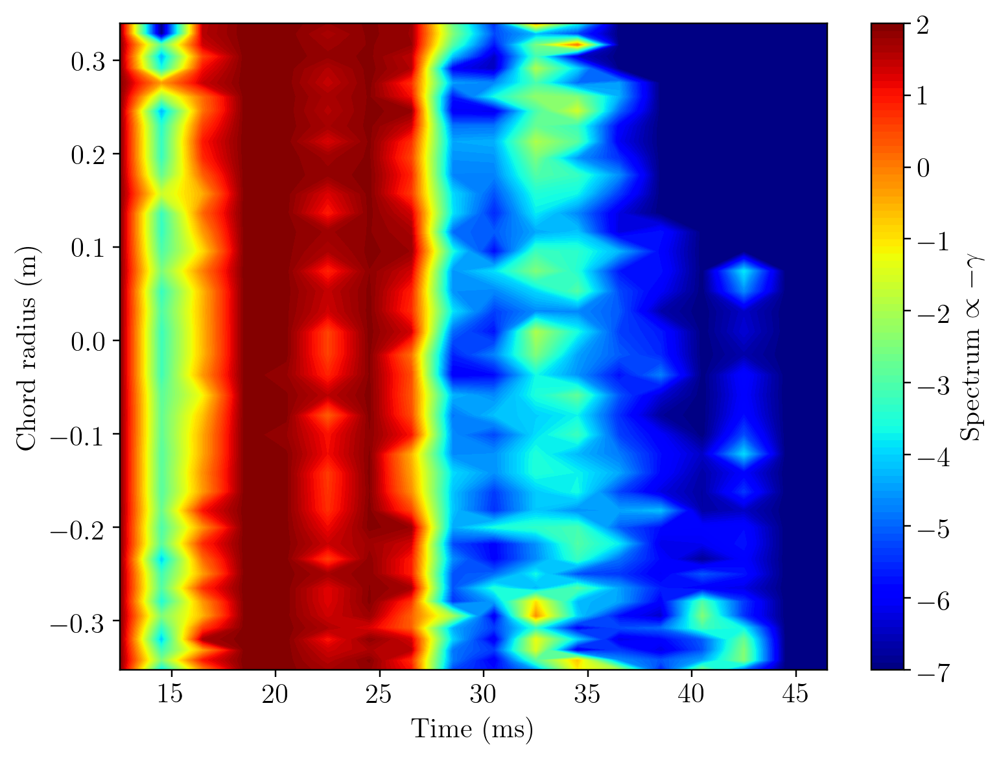

In [298]:
cax = plt.contourf(times, results[0].p, -gammas.T, 100, cmap=cm.jet, vmin=-7, vmax=2)
plt.xlabel('Time (ms)')
plt.ylabel('Chord radius (m)')
plt.colorbar(cax, label=r'Spectrum $\propto -\gamma$');

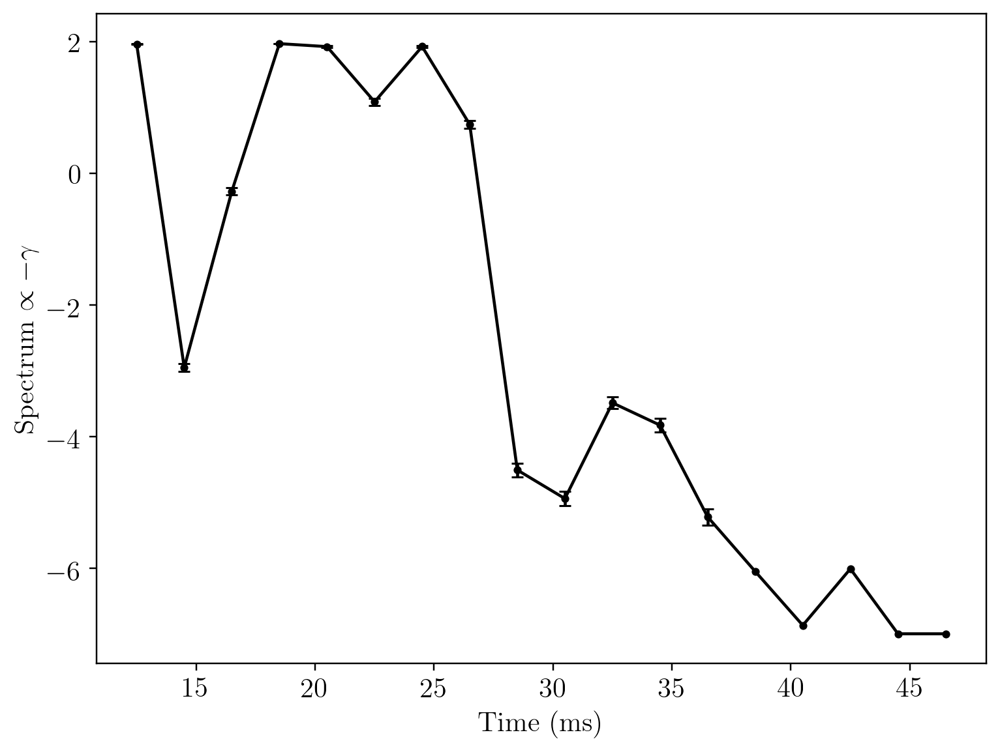

In [299]:
plt.errorbar(times, -gam_avg, yerr=gam_err, marker='o', ms=3, capsize=3, color='black', linestyle='-')
plt.ylabel(r'Spectrum $\propto -\gamma$')
plt.xlabel('Time (ms)');

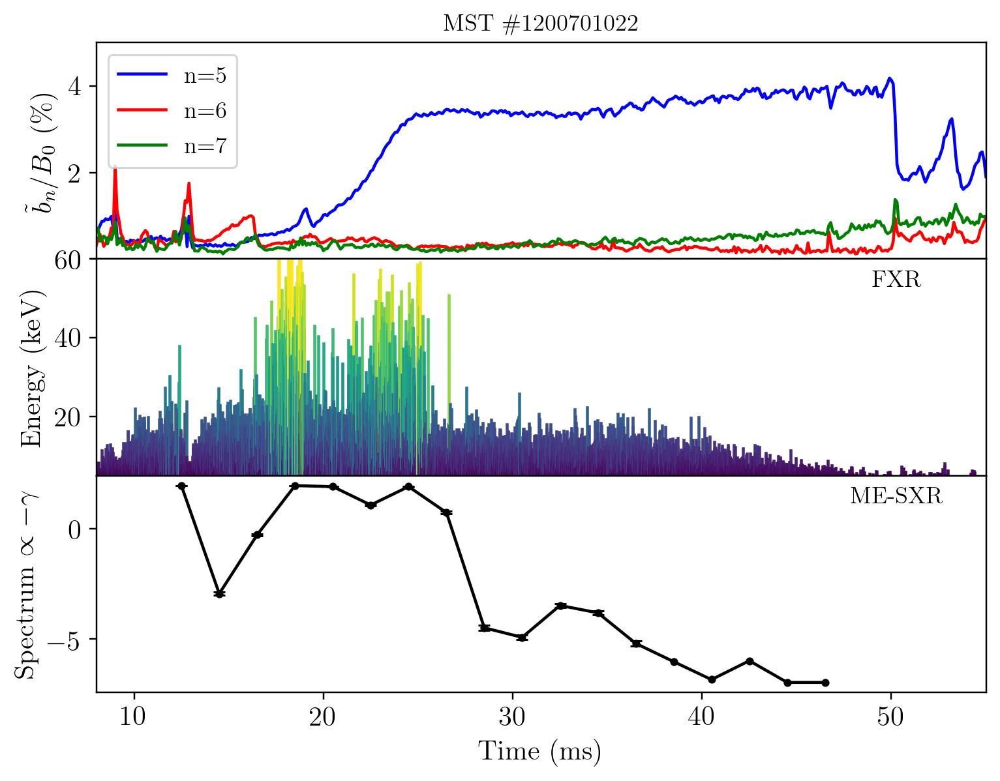

In [300]:
fig, axs = plt.subplots(3,1)
fxr_threshold = 5.0

# Load in the shot data
mags = ops.get_magnetics(shot, t_start=t_start, t_end=t_end, delta_t=delta_t, modes=np.arange(1,16))
fxr_energy, fxr_time = get_fxr_data(shot)

# Magnetics signals    
b0 = np.sqrt(mags.BP['EQ']**2 + mags.BT['EQ'])
for n,color in zip([5,6,7], ['blue','red','green']):
    key = 'N{0:02d}'.format(n)
    b_n = np.sqrt(mags.BP[key]['Amplitude']**2 + mags.BT[key]['Amplitude'])
    axs[0].plot(mags.Time, b_n / b0 * 100, label='n={0:d}'.format(n), color=color)

axs[0].legend(loc='upper left')
axs[0].set_ylabel(r'$\tilde{b}_n/B_{0}$ (\%)')
axs[0].set_ylim([0,5])

# FXR signals
norm = Normalize(fxr_threshold,60)
cmap = cm.viridis

for index in range(len(fxr_time)):
    amp = fxr_energy[index]
    if amp > fxr_threshold:
        axs[1].plot([fxr_time[index],fxr_time[index]], [0,amp], '-', color=cmap(norm(amp)))

axs[1].set_ylim([fxr_threshold, 60])
axs[1].set_ylabel('Energy (keV)')
text(0.9, 0.9, 'FXR', axs[1], color='black')

# ME-SXR core
axs[2].errorbar(times, -gam_avg, yerr=gam_err, marker='o', ms=3, capsize=3, color='black', linestyle='-')
axs[2].set_ylabel(r'Spectrum $\propto -\gamma$')
text(0.9, 0.9, 'ME-SXR', axs[2], color='black')

# Format the axes
for ax in axs[:-1]:
    ax.xaxis.set_ticklabels([])

for ax in axs:
    ax.set_xlim([t_start, t_end])
    #ax.axvspan(26.0, 27.0, color='xkcd:light gray', alpha=0.4)
    
axs[-1].set_xlabel('Time (ms)')
axs[-1].set_xlim([t_start, t_end])
plt.subplots_adjust(wspace=0, hspace=0)
axs[0].set_title(r'MST \#{0:10d}'.format(shot));

## What is up with the tomography on shot 56?

In [333]:
from mst_ida.data.sxt import load_brightness, invert_brightness
import mst_ida.data.mst_ops as ops
import mst_ida.analysis.tomography as tom

In [377]:
from mst_ida.models.base.geometry import line_of_sight

def get_tomo_emiss(tomo, npts=100):
    # Load sxr tomo data
    ells = np.linspace(-0.52, 0.52, num=npts)
    emiss_set = np.zeros([len(tomo.time), npts])
    xs = tomo.xs - tomo.major
    ys = tomo.ys

    for tn in range(len(tomo.time)):
        # Get the chord
        i_op, j_op = np.unravel_index(np.argmax(tomo.emiss[:,:,tn]), tomo.emiss[:,:,tn].shape)
        x_op, y_op = xs[i_op], ys[j_op]
        impact_phi = np.pi/2 - np.arctan2(y_op, -x_op)
        los = line_of_sight(0.0, impact_phi)
        xl, yl = los.get_xy(ells)

        # Get emissity along the chord
        emiss_interp = sp.interpolate.RegularGridInterpolator((xs, ys), tomo.emiss[:,:,tn], bounds_error=False, fill_value=0.0)
        emiss_set[tn,:] = emiss_interp(list(zip(xl, yl)))
        
    return ells, emiss_set

In [374]:
shot = 1200701056
t_start = 8.0
t_end = 55.0
delta_t = 0.1

p_ref = [0.06, 0.00, 0.0]
tomo = invert_brightness(shot, t_start=t_start, t_end=t_end, delta=delta_t, smooth=10, exclude=[20,59,60], thin=True, p_ref=p_ref)

% SXR_MST_BOX_GET_SIGNALS: beginning for shot #1200701056
% SXR_MST_BOX_GET_SIGNALS: reading SXRTOMO signals in W/m2
% SXR_MST_BOX_GET_SIGNALS: opening MST for shot 1200701056
% Compiled module: WHOAMI.
% Compiled module: FILEBREAK.
% Compiled module: CALC_GEOM_2.
% SXR_MST_BOX_GET_SIGNALS: reading SXRTOMO time base, Fri Jul 10 12:28:00 2020
% SXR_MST_BOX_GET_SIGNALS: reading SXRTOMO signals
% SXR_MST_BOX_GET_SIGNALS: assembling bright structure and transposing matrix
% SXR_MST_BOX_GET_SIGNALS: SXRTOMO done
Time=9.7567301 s
% Compiled module: WORDARRAY.
SHOT #1200701056 t=23.244474 s


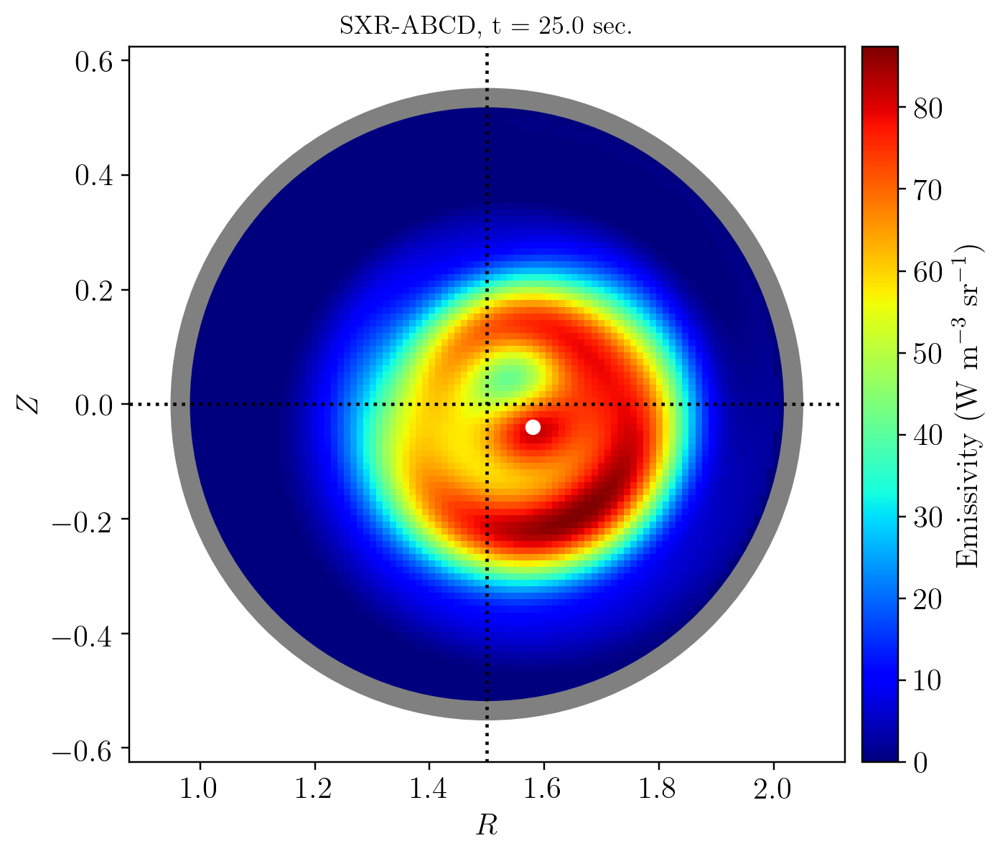

In [375]:
tn = 170
fig, ax = tom.plot_emiss(tomo, tn, cmap=cm.jet)
plt.axvline(x=tomo.major, color='black', linestyle=':')
plt.axhline(y=0, color='black', linestyle=':')
plt.plot([tomo.major+0.08], [-0.04], 'ow')

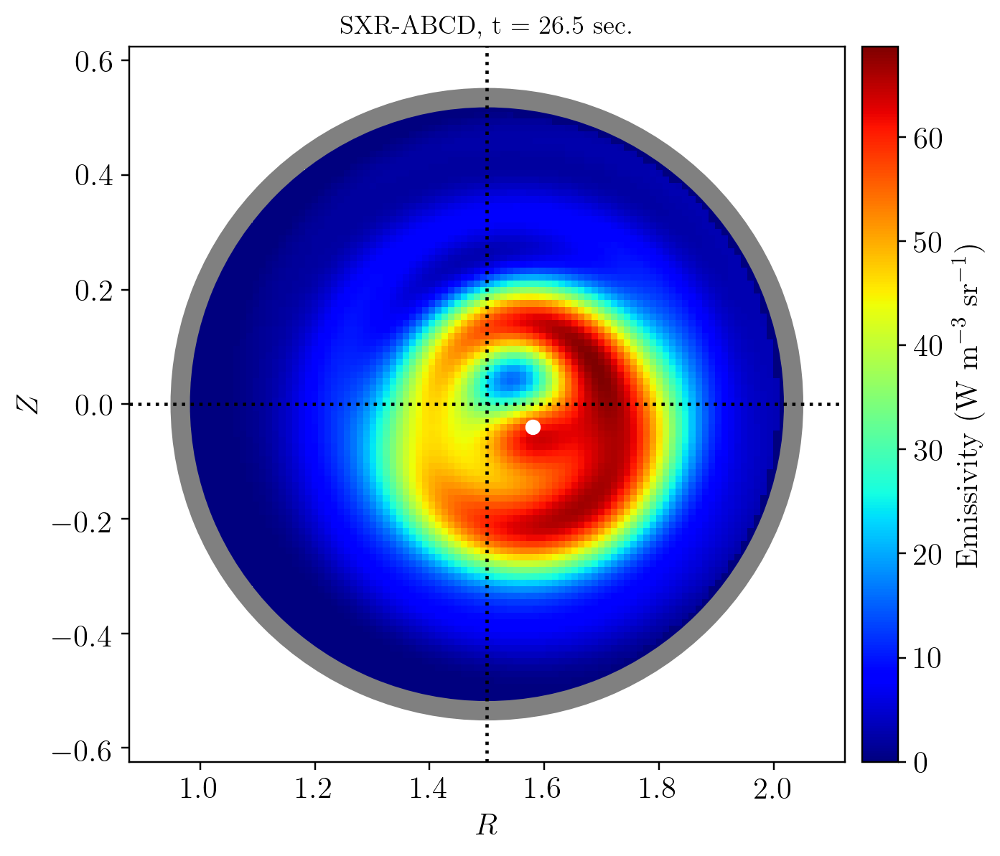

In [376]:
tn = 185
fig, ax = tom.plot_emiss(tomo, tn, cmap=cm.jet)
plt.axvline(x=tomo.major, color='black', linestyle=':')
plt.axhline(y=0, color='black', linestyle=':')
plt.plot([tomo.major+0.08], [-0.04], 'ow')

In [378]:
ells, emiss = get_tomo_emiss(tomo)

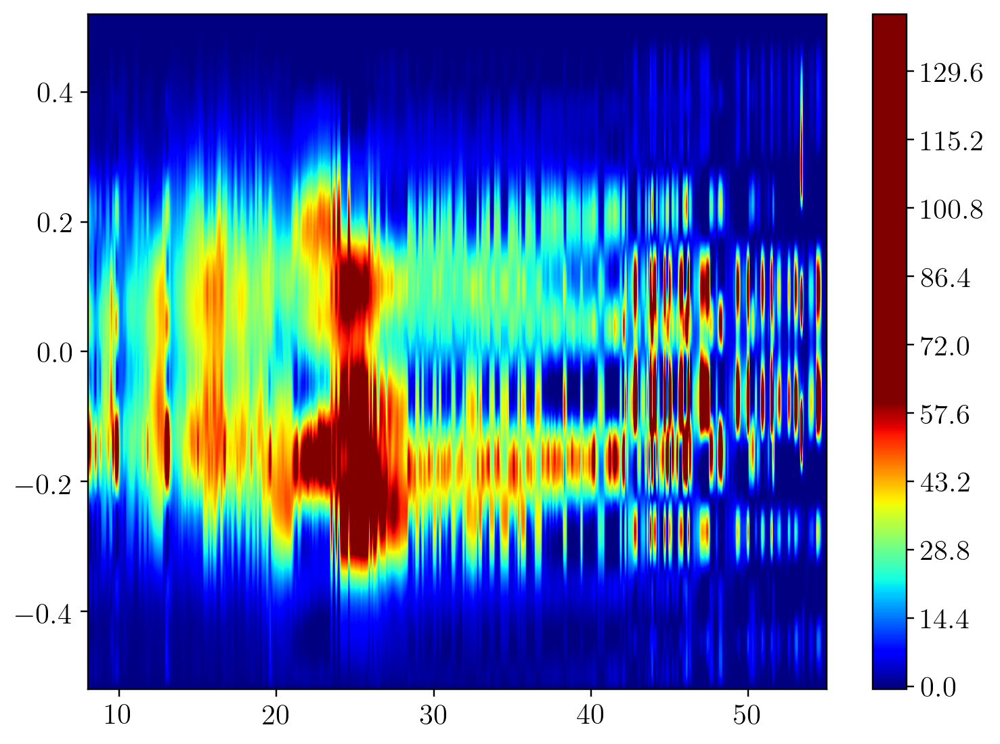

In [379]:
cax = plt.contourf(tomo.time, ells, emiss.T, 500, cmap=cm.jet, vmin=0, vmax=60)
plt.colorbar(cax);

In [903]:
p_ref = [0.08, -0.04, 0.0]
tomo = invert_brightness(shot, t_start=t_start, t_end=t_end, delta=delta_t, smooth=10, exclude=[20,59,60], thin=True, p_ref=p_ref)

% SXR_MST_BOX_GET_SIGNALS: beginning for shot #1200701056
% SXR_MST_BOX_GET_SIGNALS: reading SXRTOMO signals in W/m2
% SXR_MST_BOX_GET_SIGNALS: opening MST for shot 1200701056
% Compiled module: WHOAMI.
% Compiled module: FILEBREAK.
% Compiled module: CALC_GEOM_2.
% SXR_MST_BOX_GET_SIGNALS: reading SXRTOMO time base, Sun Jul 19 14:46:52 2020
% SXR_MST_BOX_GET_SIGNALS: reading SXRTOMO signals
% SXR_MST_BOX_GET_SIGNALS: assembling bright structure and transposing matrix
% SXR_MST_BOX_GET_SIGNALS: SXRTOMO done
Time=11.323730 s
% Compiled module: WORDARRAY.
SHOT #1200701056 t=23.820374 s


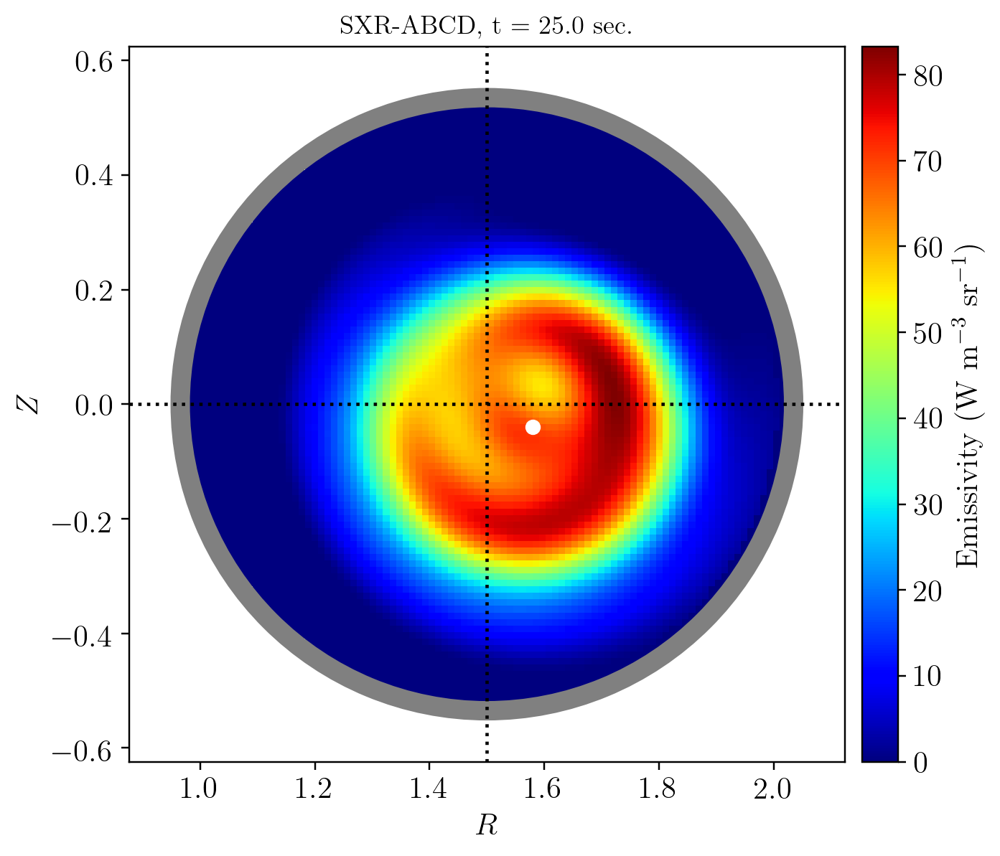

In [381]:
tn = 170
fig, ax = tom.plot_emiss(tomo, tn, cmap=cm.jet)
plt.axvline(x=tomo.major, color='black', linestyle=':')
plt.axhline(y=0, color='black', linestyle=':')
plt.plot([tomo.major+0.08], [-0.04], 'ow')

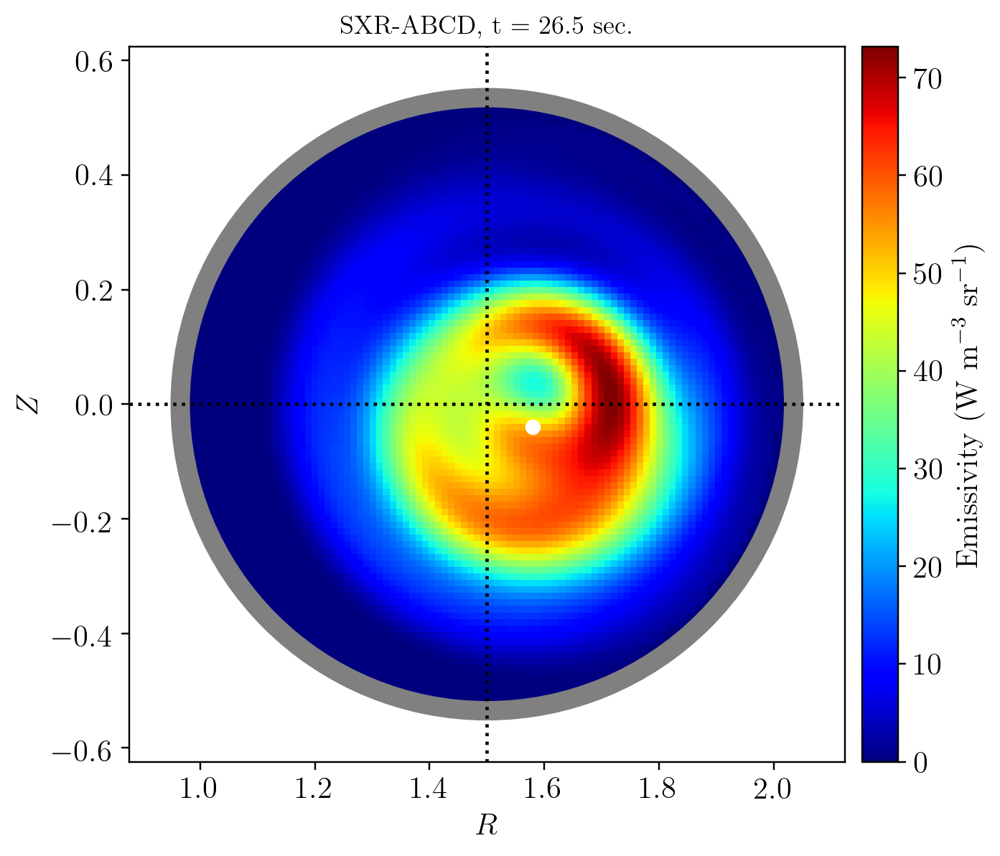

In [382]:
tn = 185
fig, ax = tom.plot_emiss(tomo, tn, cmap=cm.jet)
plt.axvline(x=tomo.major, color='black', linestyle=':')
plt.axhline(y=0, color='black', linestyle=':')
plt.plot([tomo.major+0.08], [-0.04], 'ow')

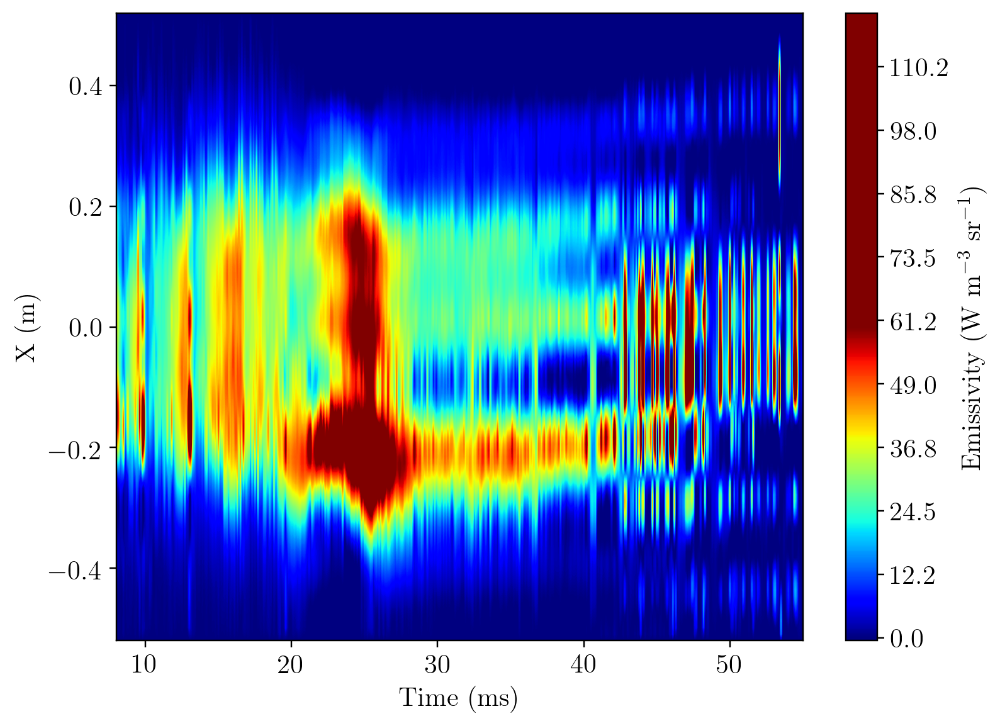

In [905]:
ells, emiss = get_tomo_emiss(tomo)
cax = plt.contourf(tomo.time, ells, emiss.T, 500, cmap=cm.jet, vmin=0, vmax=60)
plt.colorbar(cax, label=r'Emissivity (W m$^{-3}$ sr$^{-1}$)')
plt.xlabel('Time (ms)')
plt.ylabel('X (m)');

Where do I think the structure should be?

In [369]:
import mst_ida.models.base.flux_maps as fm
import mst_ida.models.plasma as pm

time_ms = 26.5
shax = fm.QSH_Map(shot, time_ms)
eq3d = pm.QSH_Equilibrium(shax)

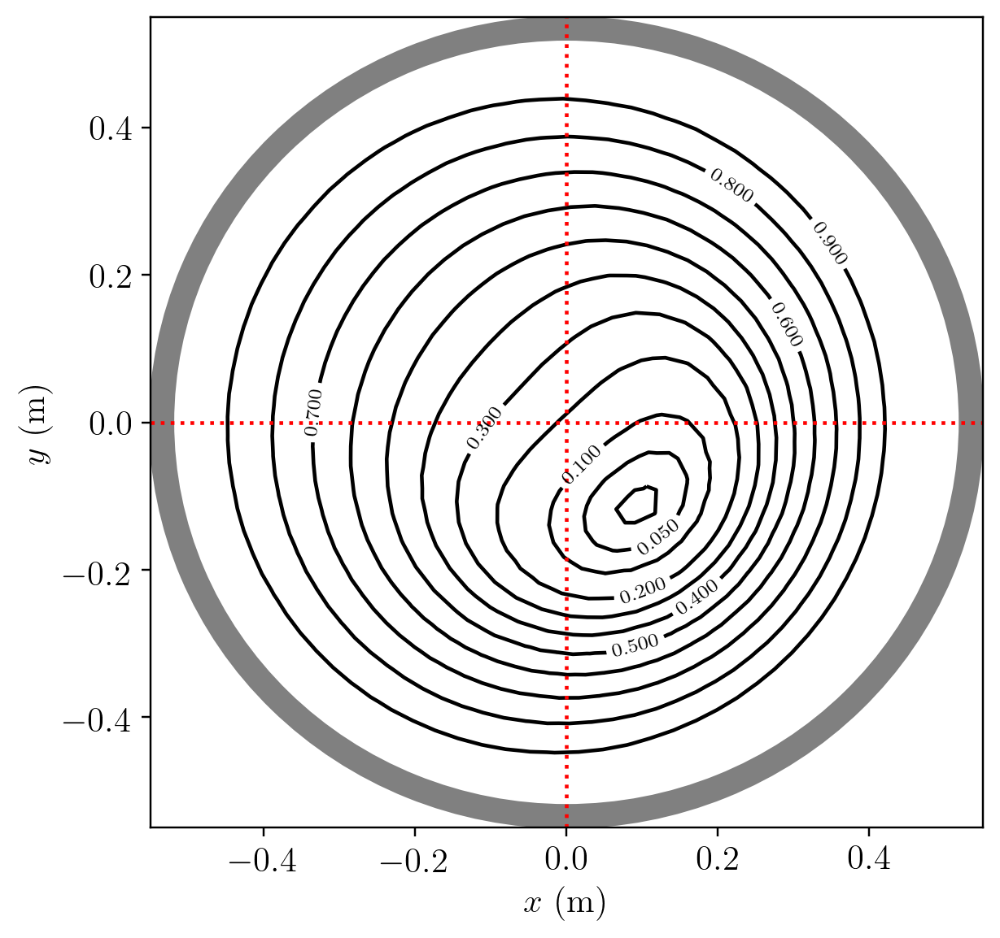

In [370]:
fig, ax = plt.subplots(1,1, figsize=(6,6))
levels = [0.02, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
cax = plt.tricontour(shax.flux.sxt.xs, shax.flux.sxt.ys, shax.flux.sxt.ss, levels, colors='black')
plt.clabel(cax, inline=True, fontsize=8)

overplot_shell(plt.gca())
plt.ylim([-0.55,0.55])
plt.xlim([-0.55,0.55])
plt.xlabel(r'$x$ (m)')
plt.ylabel(r'$y$ (m)')
plt.axvline(x=0, color='red', linestyle=':')
plt.axhline(y=0, color='red', linestyle=':')
text(0.07, 0.95, r'$255^{\circ}$', axs[1]);

## Looking at HXRs using a $\kappa$-distribution

In [384]:
from scipy.special import gamma
import mst_ida.models.base.response as rsp

# -------------------------------------------------- Distributions --------------------------------------------------
def maxwell_dist(en, Te=1000.0):
    return 2/(np.sqrt(np.pi)*Te**1.5)*(en**0.5)*np.exp(-en/Te)

def kappa_const(kappa):
    return gamma(kappa + 1) / (gamma(kappa - 0.5)*(kappa - 1.5)**1.5)
    
def kappa_dist(en, Te=1000.0, kappa=2.0):
    return kappa_const(kappa)*2/(np.sqrt(np.pi)*Te**1.5)*(en**0.5) / (1 + (en)/( (kappa - 1.5)*Te ))**(kappa + 1)

def perc_increase(lower_en=5000, Te=1000.0, kappa=2.0):
    en = np.linspace(lower_en, 50000, num=20000)
    int_maxwell = np.trapz(maxwell_dist(en, Te=Te), x=en)
    int_kappa = np.trapz(kappa_dist(en, Te=Te, kappa=kappa), x=en)
    return 100.0*(int_kappa - int_maxwell)/int_maxwell

# -------------------------------------------------- Emissivity --------------------------------------------------
Ck = 1e8
Cm = 1e19

def emiss_kappa(en, Te=1000, kappa=4):
    return Ck * np.sqrt(Te) * ((kappa - 1.5) / kappa) * ((en/Te/(kappa - 1.5)) + 1)**(-kappa)

def emiss_maxwell(en, Te=1000):
    return Cm * np.exp(-en/Te) / np.sqrt(Te)

# -------------------------------------------------- Ratios --------------------------------------------------
Ew = 550.
ref_Ec = 5000.
en = np.linspace(3000, 30000, num=2000)

# Maxwellian
def get_en_int_maxwell(Te, Ec):
    resp = rsp.Pilatus_Response(Ec, Ew)
    return np.trapz(resp(en)*np.exp(-en/Te)/np.sqrt(Te)/en, x=en)

def model_ratio_maxwell(Te, Ec):
    en_int = get_en_int_maxwell(Te, Ec)
    ref = get_en_int_maxwell(Te, ref_Ec)
    return en_int / ref

# Kappa
def get_en_int_kappa(Te, Ec, kappa=4):
    resp = rsp.Pilatus_Response(Ec, Ew)
    spec = ((en/Te)/(kappa - 1.5) + 1)**(-kappa)
    return np.trapz(resp(en)*spec/en, x=en)

def model_ratio_kappa(Te, Ec, kappa=4):
    en_int = get_en_int_kappa(Te, Ec, kappa=kappa)
    ref = get_en_int_kappa(Te, ref_Ec, kappa=kappa)
    return en_int / ref

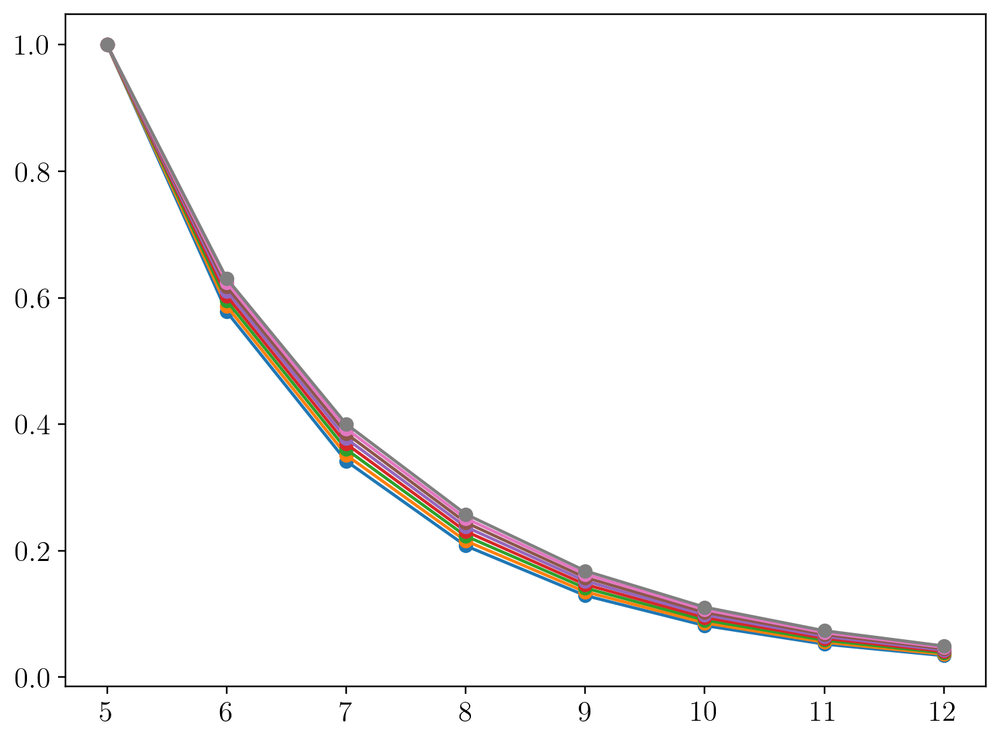

In [397]:
temps = np.array([500., 600., 700., 800., 900., 1000., 1100., 1200.])
kappa = 4.0
Ec_set = np.array([Ec*1000. for Ec in thresholds if Ec != ref_Ec/1000.])

for temp in temps:
    model = np.array([model_ratio_kappa(temp, Ec*1000., kappa=kappa) for Ec in thresholds])
    plt.plot(thresholds, model, '-o')

/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in power
/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in power
/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in power


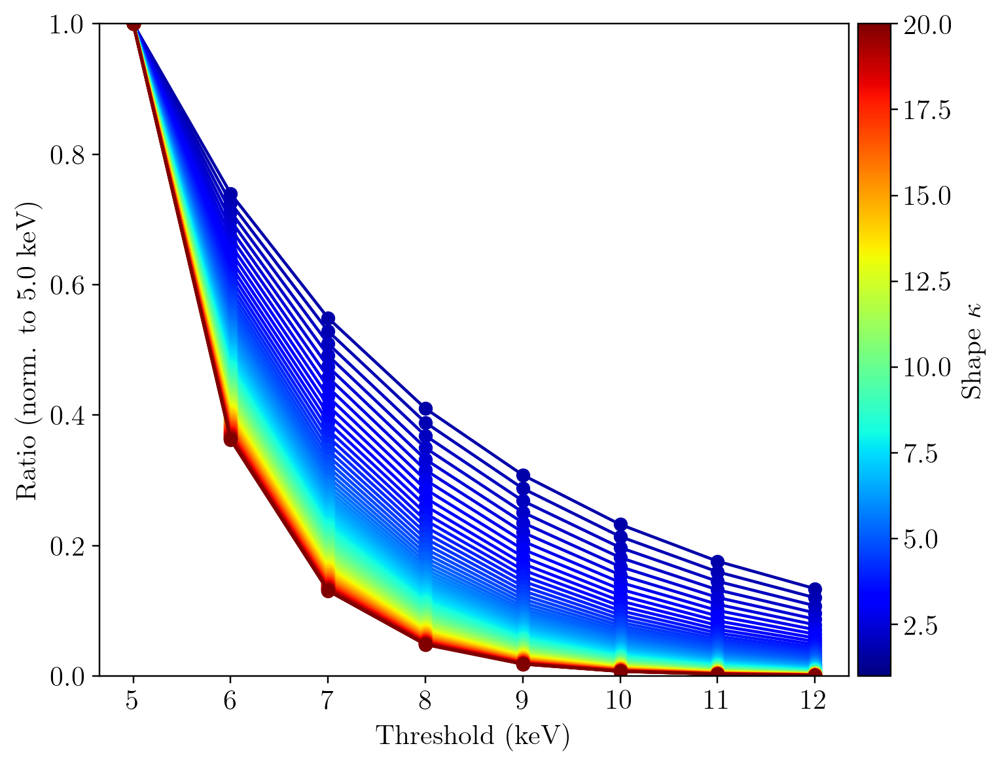

In [411]:
temp = 750.
kappas = np.linspace(1.1, 20.0, num=100)
Ec_set = np.array([Ec*1000. for Ec in thresholds if Ec != ref_Ec/1000.])

norm = Normalize(1,20)
cmap = cm.jet

for kappa in kappas:
    model = np.array([model_ratio_kappa(temp, Ec*1000., kappa=kappa) for Ec in thresholds])
    plt.plot(thresholds, model, '-o', color=cmap(norm(kappa)))
    
cbar = plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), pad=0.01, label=r'Shape $\kappa$')
plt.xlabel('Threshold (keV)')
plt.ylabel('Ratio (norm. to 5.0 keV)')
plt.ylim([0,1]);

In [ ]:
thresholds = np.array([3.5, 4.0, 4.5, 5.0, 5.5])
temps = np.linspace(10, 2200, num=1000)
log_kappas = np.linspace(0.2, 3, num=500)
kappas = 10.0**log_kappas
ratios = {Ec:np.zeros([len(temps), len(kappas)]) for Ec in thresholds}

for Ec in thresholds:
    print('Beginning scan for Ec = {0:.1f}'.format(Ec))
    for i,Te in enumerate(tqdm(temps)):
        for j,kappa in enumerate(kappas):
            ratios[Ec][i,j] = model_ratio_kappa(Te, Ec*1000., kappa=kappa)

## Separate each shot into phases

In [412]:
shot = 1200701056
t_start = 8.0
t_end = 55.0
delta_t = 0.1

fxr_energy, fxr_time = get_fxr_data(shot)
mags = ops.get_magnetics(shot, t_start=t_start, t_end=t_end, delta_t=delta_t, modes=np.arange(1,16))

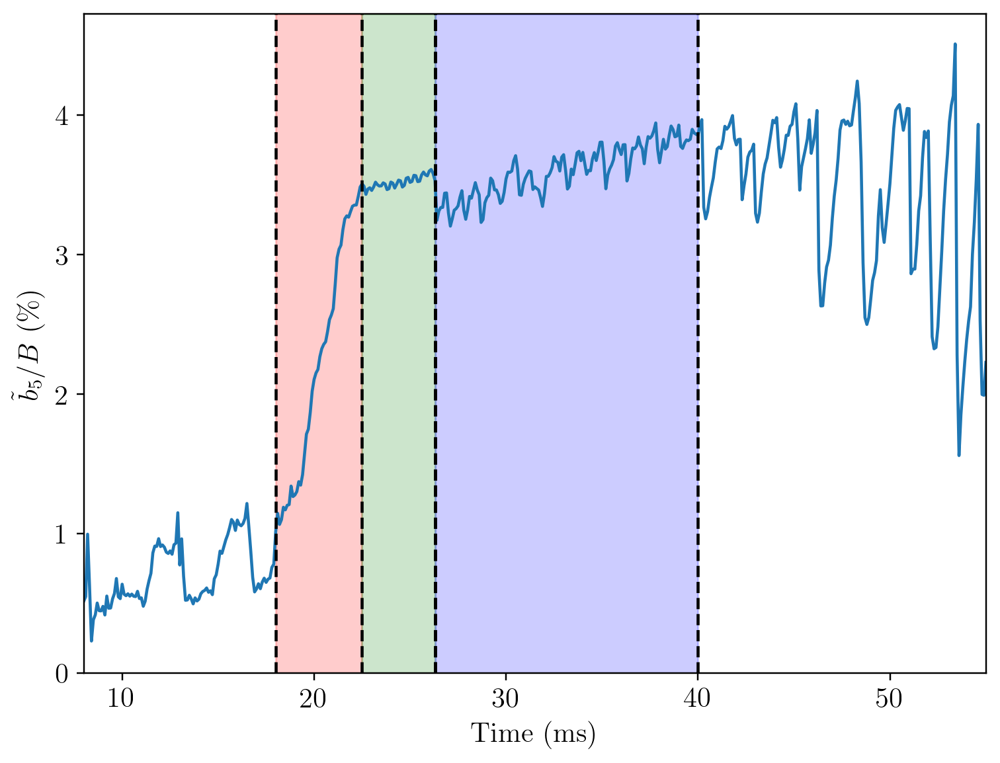

In [439]:
plt.plot(mags.Time, mags.BP['N05']['Amplitude']/mags.BP['EQ']*100.)

plt.xlim([t_start,t_end])
plt.ylim([0,None])
plt.xlabel('Time (ms)')
plt.ylabel(r'$\tilde{b}_5/B$ (\%)')

# Highlight the regions
rise_start = 18.0
rise_end = 22.5
quiet_end = 26.3
flat_start = 26.3
flat_end = 40.0

plt.axvline(x=rise_start, color='black', linestyle='dashed')
plt.axvline(x=rise_end, color='black', linestyle='dashed')
plt.axvspan(rise_start, rise_end, color='red', alpha=0.2)
plt.axvline(x=quiet_end, color='black', linestyle='dashed')
plt.axvspan(rise_end, quiet_end, color='green', alpha=0.2)
plt.axvline(x=flat_start, color='black', linestyle='dashed')
plt.axvline(x=flat_end, color='black', linestyle='dashed')
plt.axvspan(flat_start, flat_end, color='blue', alpha=0.2);

In [519]:
import pandas as pd
nan = np.nan

shot_base = 1200701000
qsh_data = {
    'shot': [  22,  37,  38,  41,  43,  45,  47,  48,  49,  53,  55,  56],
    'rise': [19.5,21.0,19.0,15.0,18.0,21.0,20.0,20.5,18.5,14.0,19.0,18.0],
    'peak': [25.0,27.5,24.0,18.5,23.8,28.5,26.0,27.5,23.5,17.0,27.5,22.5],
    'quiet':[28.3,28.5,25.0, nan,26.6, nan,27.5,29.3,24.5,19.0,30.0,26.3]
}

for index in range(len(qsh_data['shot'])):
    qsh_data['shot'][index] += shot_base

df = pd.DataFrame(qsh_data)
df = df.set_index('shot')

In [527]:
df

,rise,peak,quiet
shot,,,
1200701022,19.5,25.0,28.3
1200701037,21.0,27.5,28.5
1200701038,19.0,24.0,25.0
1200701041,15.0,18.5,NaN
1200701043,18.0,23.8,26.6
1200701045,21.0,28.5,NaN
1200701047,20.0,26.0,27.5
1200701048,20.5,27.5,29.3
1200701049,18.5,23.5,24.5


In [760]:
shot = 1200702072
t_start = 8.0
t_end = 55.0
delta_t = 0.1

mags = ops.get_magnetics(shot, t_start=t_start, t_end=t_end, delta_t=delta_t, modes=np.arange(1,16))

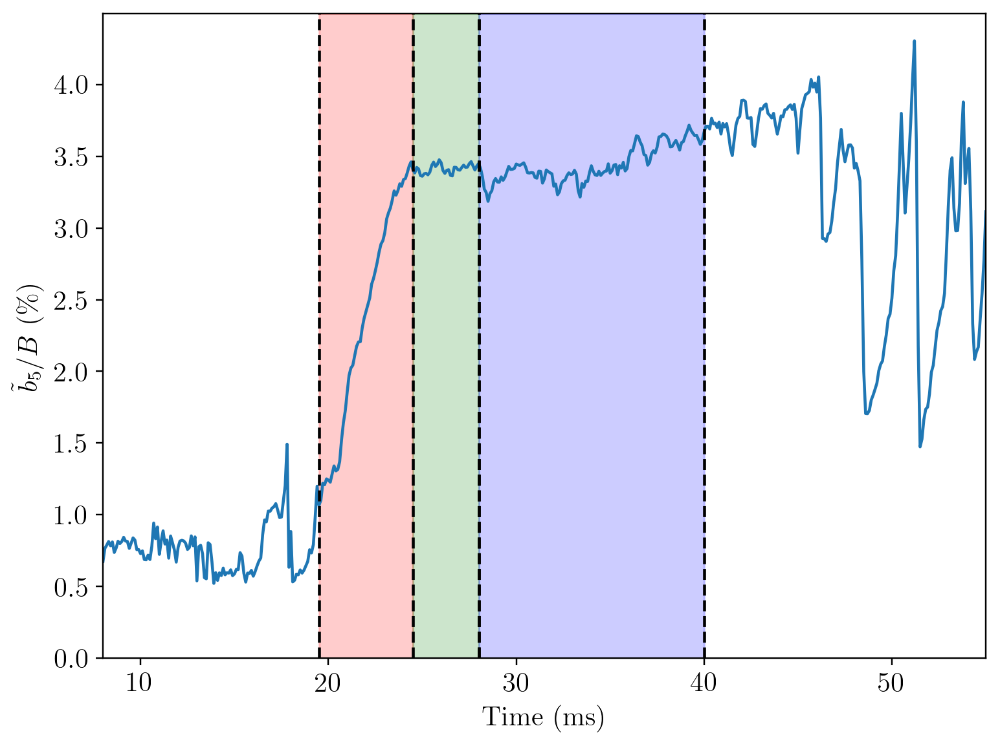

In [761]:
plt.plot(mags.Time, mags.BP['N05']['Amplitude']/mags.BP['EQ']*100.)

plt.xlim([t_start,t_end])
plt.ylim([0,None])
plt.xlabel('Time (ms)')
plt.ylabel(r'$\tilde{b}_5/B$ (\%)')

# Highlight the regions
rise_start = 19.5
rise_end = 24.5
quiet_end = 28.0
flat_start = quiet_end
flat_end = 40.0

plt.axvline(x=rise_start, color='black', linestyle='dashed')
plt.axvline(x=rise_end, color='black', linestyle='dashed')
plt.axvspan(rise_start, rise_end, color='red', alpha=0.2)
plt.axvline(x=quiet_end, color='black', linestyle='dashed')
plt.axvspan(rise_end, quiet_end, color='green', alpha=0.2)
plt.axvline(x=flat_start, color='black', linestyle='dashed')
plt.axvline(x=flat_end, color='black', linestyle='dashed')
plt.axvspan(flat_start, flat_end, color='blue', alpha=0.2);

In [753]:
shot = 1200702026
t_start = 8.0
t_end = 55.0
delta_t = 0.1

mags = ops.get_magnetics(shot, t_start=t_start, t_end=t_end, delta_t=delta_t, modes=np.arange(1,16))

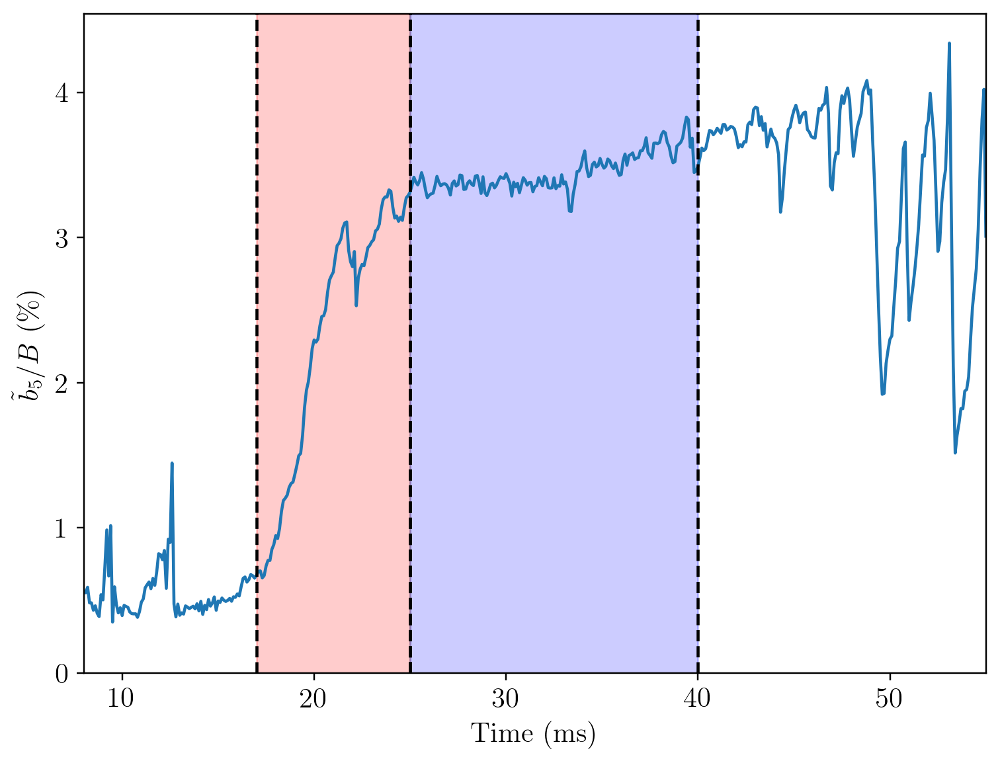

In [759]:
plt.plot(mags.Time, mags.BP['N05']['Amplitude']/mags.BP['EQ']*100.)

plt.xlim([t_start,t_end])
plt.ylim([0,None])
plt.xlabel('Time (ms)')
plt.ylabel(r'$\tilde{b}_5/B$ (\%)')

# Highlight the regions
rise_start = 17.0
rise_end = 25.0
quiet_end = rise_end
flat_start = rise_end
flat_end = 40.0

plt.axvline(x=rise_start, color='black', linestyle='dashed')
plt.axvline(x=rise_end, color='black', linestyle='dashed')
plt.axvspan(rise_start, rise_end, color='red', alpha=0.2)
plt.axvline(x=quiet_end, color='black', linestyle='dashed')
plt.axvspan(rise_end, quiet_end, color='green', alpha=0.2)
plt.axvline(x=flat_start, color='black', linestyle='dashed')
plt.axvline(x=flat_end, color='black', linestyle='dashed')
plt.axvspan(flat_start, flat_end, color='blue', alpha=0.2);

## Average spectrum during the rise phase

In [888]:
shot = 1200701056
photons = []
fxr_threshold = 5.0

for shot in df.index:
    fxr_energy, fxr_time = get_fxr_data(shot)
    
    t0 = df.rise[shot]
    t1 = df.peak[shot]

    # How many counts are in this interval
    for index,t in enumerate(fxr_time):
        if t0 < t < t1:
            if fxr_energy[index] > fxr_threshold:
                photons.append(fxr_energy[index])
            
photons_rise = np.array(photons)

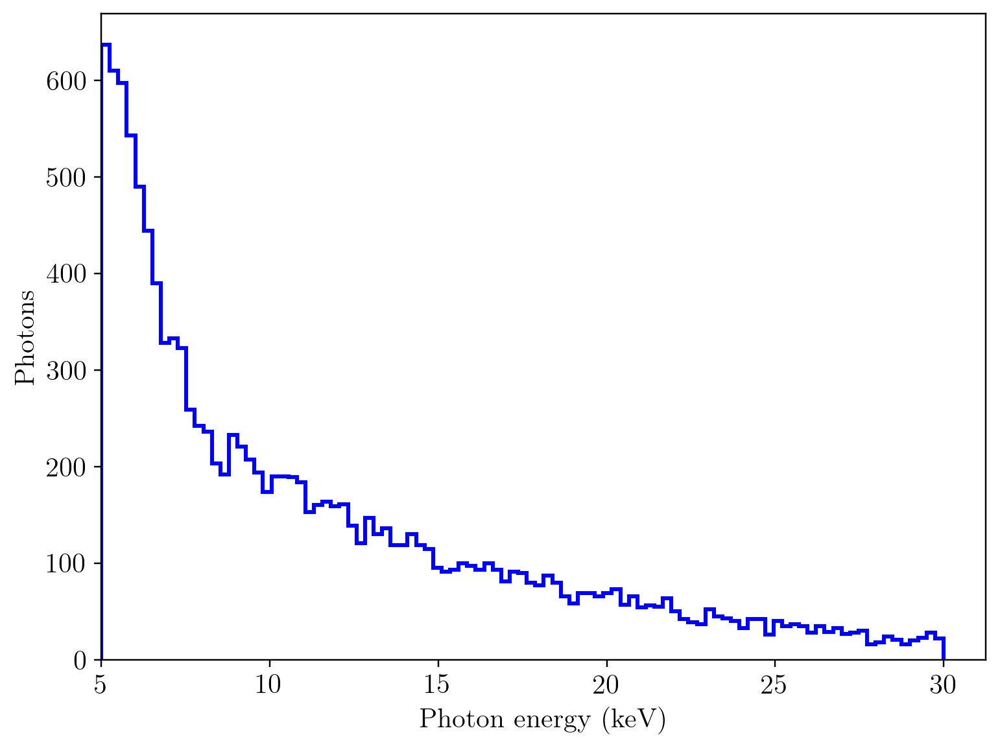

In [889]:
bins = np.linspace(fxr_threshold,30, num=100)
counts, bins, _ = plt.hist(photons_rise, bins=bins, histtype='step', color='blue', linewidth=2)
energies = np.array([(bins[index]+bins[index+1])/2 for index in range(len(bins)-1)])

plt.xlabel('Photon energy (keV)')
plt.ylabel('Photons')
plt.xlim([fxr_threshold,None]);

Ok, so let's convert these bins to points to make the comparison simpler. The low-energy part seems compatible with a Maxwellian spectrum. However I think I first need to "repair" the distortion caused by the 150 $\mu$m Be filter.

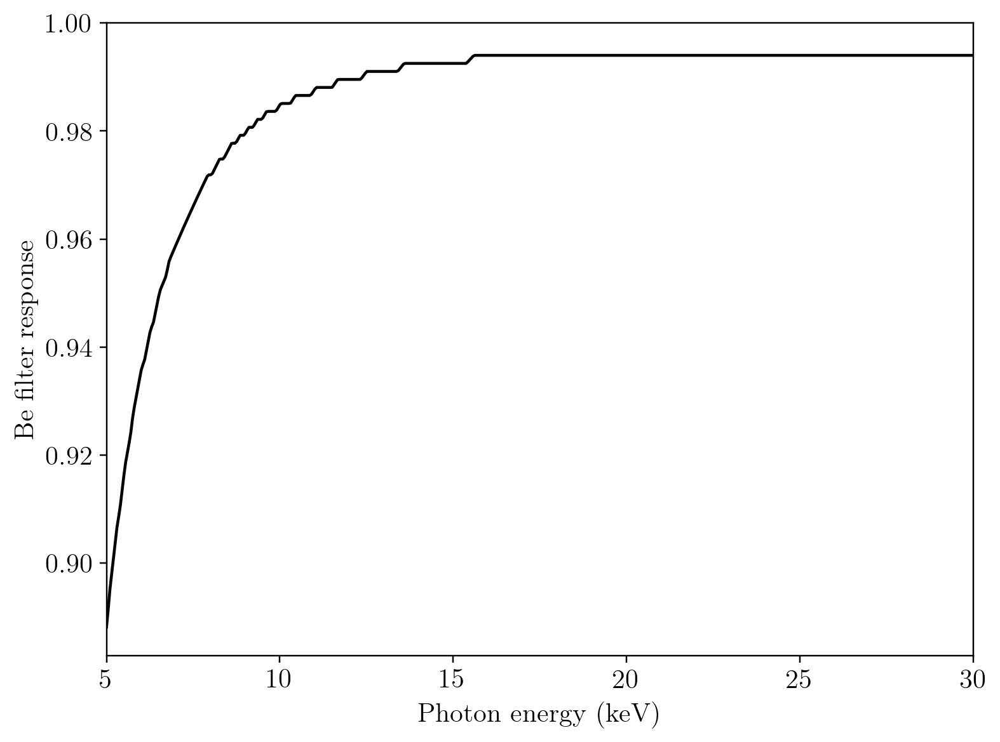

In [890]:
from mst_ida.models.base.response import Filter

resp = Filter('Be', 0.0150)
en = np.linspace(5,30,num=500)
plt.plot(en, resp(en*1000), color='black')

plt.xlabel('Photon energy (keV)')
plt.ylabel('Be filter response')
plt.xlim([5,30])
plt.ylim([None,1]);

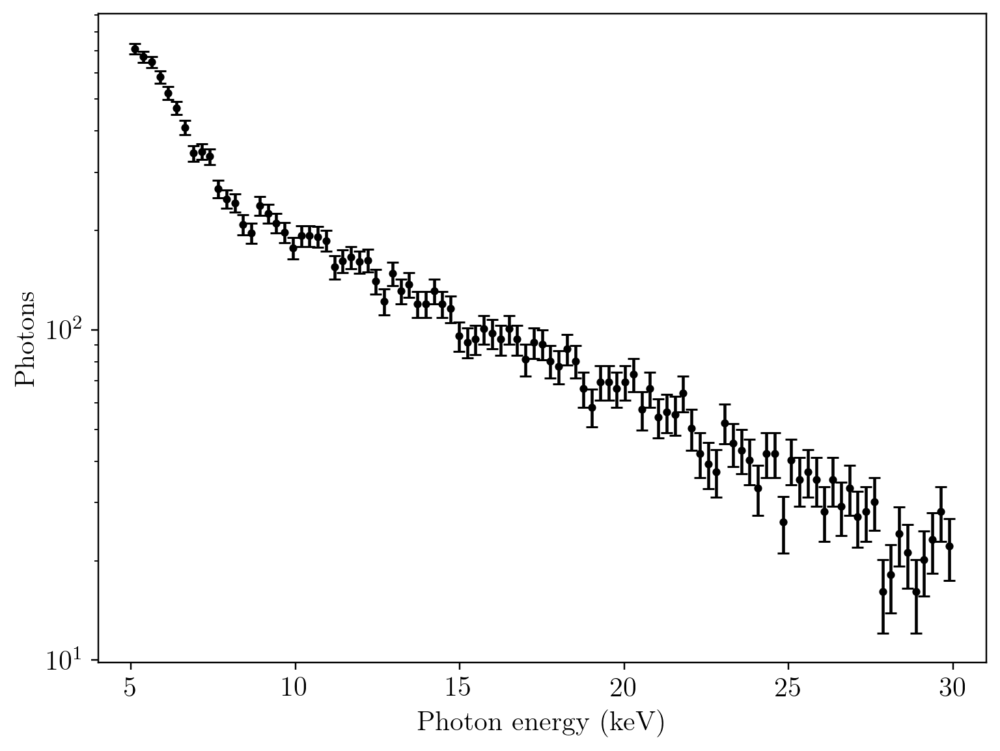

In [891]:
x = energies
y = counts/resp(energies*1000)
yerr = np.sqrt(y)

plt.errorbar(x, y, yerr=yerr, marker='o', ms=3, capsize=3, linestyle='None', color='black')
plt.yscale('log')
plt.xlabel('Photon energy (keV)')
plt.ylabel('Photons')
plt.xlim([4, 31]);

In [892]:
def emiss_2temp(en, c1, c2, Te1, Te2):
    return c1*np.exp(-en/Te1)/np.sqrt(Te1)/en + c2*np.exp(-en/Te2)/np.sqrt(Te2)/en

def emiss_temp(en, c, Te):
    return c*np.exp(-en/Te)/np.sqrt(Te)/en

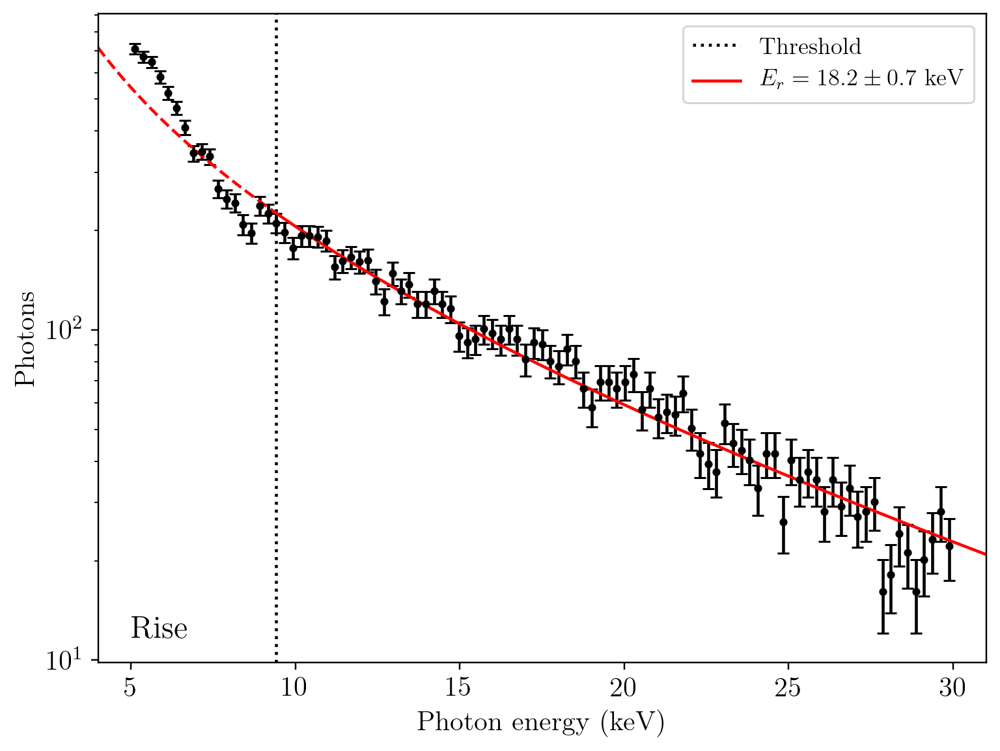

In [893]:
x = energies
y = counts/resp(energies*1000)
yerr = np.sqrt(y)

plt.errorbar(x, y, yerr=yerr, marker='o', ms=3, capsize=3, linestyle='None', color='black')
plt.yscale('log')
plt.xlabel('Photon energy (keV)')
plt.ylabel('Photons')

n_start = 17
popt, cov = sp.optimize.curve_fit(emiss_temp, x[n_start:], y[n_start:], p0=[1e4, 10.0], sigma=yerr[n_start:])
plt.axvline(x=x[n_start], linestyle=':', color='black', label='Threshold')

en = np.linspace(x[n_start], 31, num=100)
plt.plot(en, emiss_temp(en, *popt), color='red', label=r'$E_r = {0:.1f} \pm {1:.1f}$ keV'.format(popt[1], np.sqrt(cov[1,1])))
en = np.linspace(4, x[n_start], num=100)
plt.plot(en, emiss_temp(en, *popt), color='red', linestyle='--')

plt.legend()
plt.xlim([4, 31])
text(0.07, 0.05, 'Rise', plt.gca(), fontsize=16);

## Flattop phase

In [884]:
photons = []
fxr_threshold = 5.0

for shot in df.index:
    fxr_energy, fxr_time = get_fxr_data(shot)
    
    t0 = df.quiet[shot] if not np.isnan(df.quiet[shot]) else df.peak[shot]
    t1 = 40.0

    # How many counts are in this interval
    for index,t in enumerate(fxr_time):
        if t0 < t < t1:
            if fxr_energy[index] > fxr_threshold:
                photons.append(fxr_energy[index])
            
photons_flat = np.array(photons)

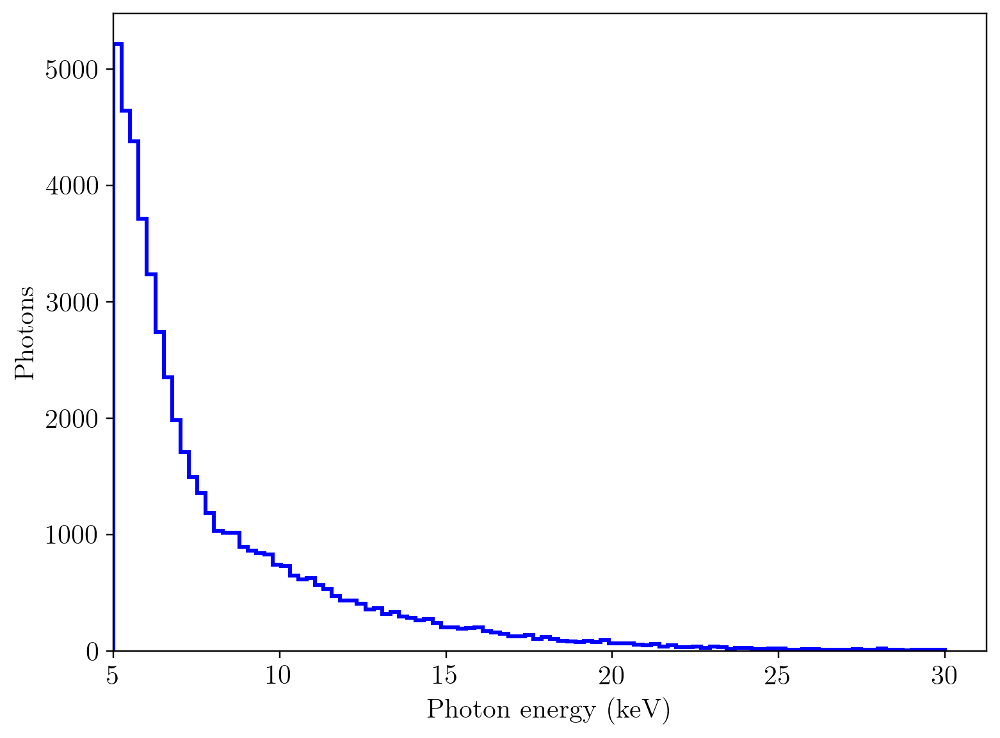

In [885]:
bins = np.linspace(fxr_threshold,30, num=100)
counts, bins, _ = plt.hist(photons_flat, bins=bins, histtype='step', color='blue', linewidth=2)
energies = np.array([(bins[index]+bins[index+1])/2 for index in range(len(bins)-1)])

plt.xlabel('Photon energy (keV)')
plt.ylabel('Photons')
plt.xlim([fxr_threshold,None]);

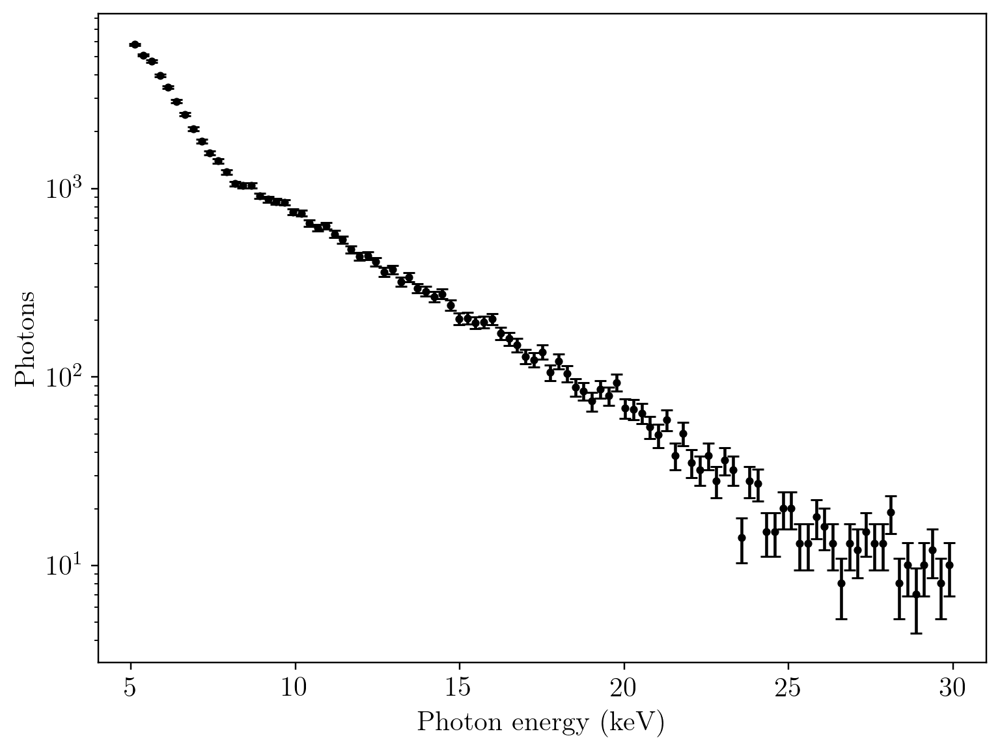

In [886]:
x = energies
y = counts/resp(energies*1000)
yerr = np.sqrt(y)

plt.errorbar(x, y, yerr=yerr, marker='o', ms=3, capsize=3, linestyle='None', color='black')
plt.yscale('log')
plt.xlabel('Photon energy (keV)')
plt.ylabel('Photons')
plt.xlim([4, 31]);

/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in sqrt
  """


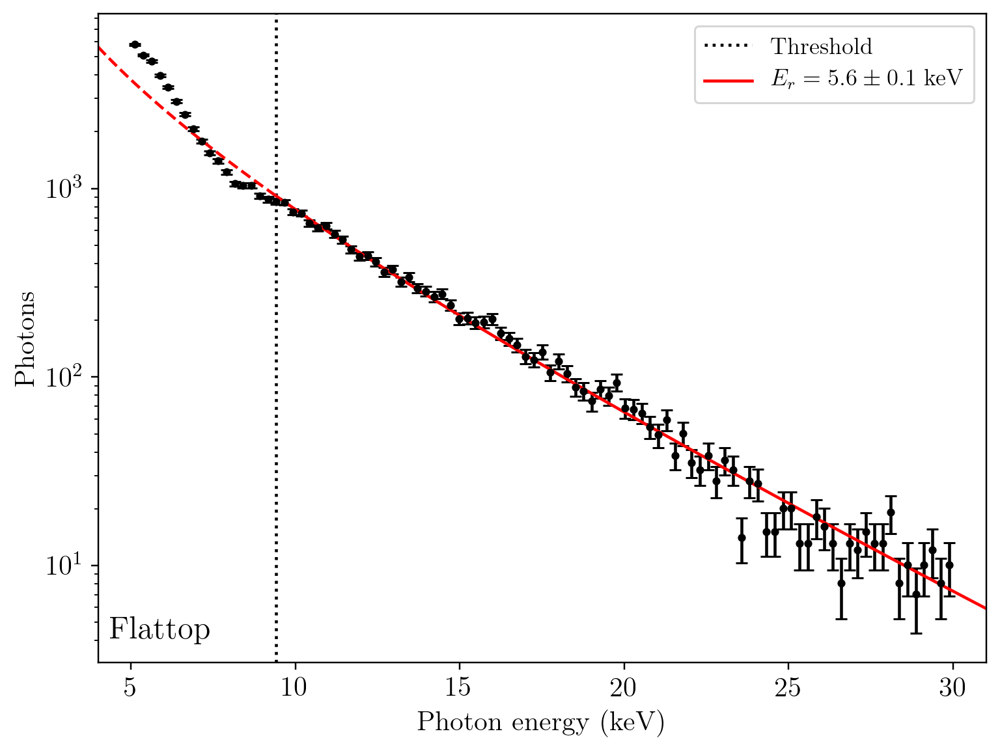

In [887]:
x = energies
y = counts/resp(energies*1000)
yerr = np.sqrt(y)

plt.errorbar(x, y, yerr=yerr, marker='o', ms=3, capsize=3, linestyle='None', color='black')
plt.yscale('log')
plt.xlabel('Photon energy (keV)')
plt.ylabel('Photons')
plt.xlim([4, 31]);

n_start = 17
popt, cov = sp.optimize.curve_fit(emiss_temp, x[n_start:], y[n_start:], p0=[1e4, 10.0], sigma=yerr[n_start:])
plt.axvline(x=x[n_start], linestyle=':', color='black', label='Threshold')

en = np.linspace(x[n_start], 31, num=100)
plt.plot(en, emiss_temp(en, *popt), color='red', label=r'$E_r = {0:.1f} \pm {1:.1f}$ keV'.format(popt[1], np.sqrt(cov[1,1])))
en = np.linspace(4, x[n_start], num=100)
plt.plot(en, emiss_temp(en, *popt), color='red', linestyle='--')

plt.legend()
plt.xlim([4, 31])
text(0.07, 0.05, 'Flattop', plt.gca(), fontsize=16);

## Quiet period

In [894]:
photons = []
fxr_threshold = 5.0

for shot in df.index:
    if not np.isnan(df.quiet[shot]):
        fxr_energy, fxr_time = get_fxr_data(shot)

        t0 = df.peak[shot]
        t1 = df.quiet[shot]

        # How many counts are in this interval
        for index,t in enumerate(fxr_time):
            if t0 < t < t1:
                if fxr_energy[index] > fxr_threshold:
                    photons.append(fxr_energy[index])
            
photons_quiet = np.array(photons)

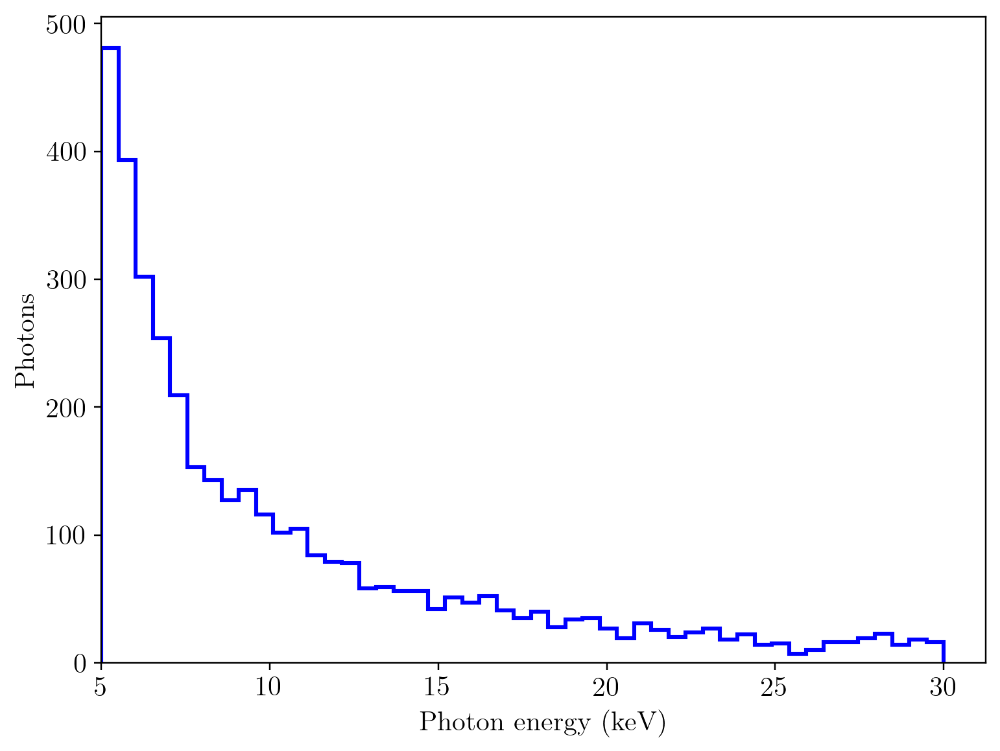

In [895]:
bins = np.linspace(fxr_threshold,30, num=50)
counts, bins, _ = plt.hist(photons_quiet, bins=bins, histtype='step', color='blue', linewidth=2)
energies = np.array([(bins[index]+bins[index+1])/2 for index in range(len(bins)-1)])

plt.xlabel('Photon energy (keV)')
plt.ylabel('Photons')
plt.xlim([fxr_threshold,None]);

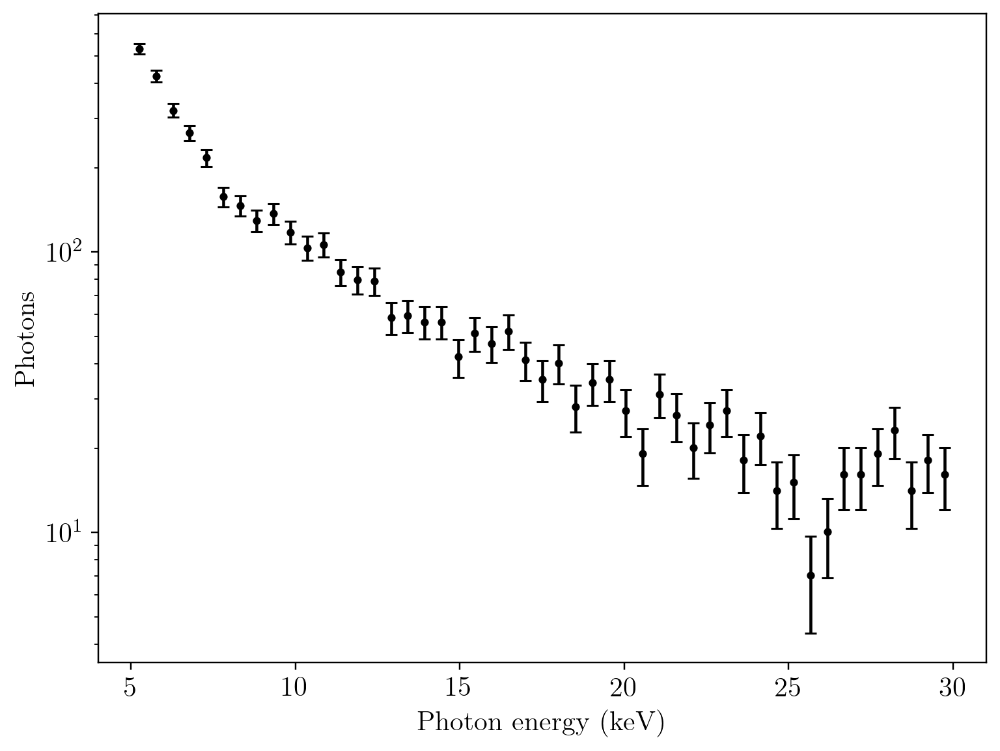

In [896]:
x = energies
y = counts/resp(energies*1000)
yerr = np.sqrt(y)

plt.errorbar(x, y, yerr=yerr, marker='o', ms=3, capsize=3, linestyle='None', color='black')
plt.yscale('log')
plt.xlabel('Photon energy (keV)')
plt.ylabel('Photons')
plt.xlim([4, 31]);

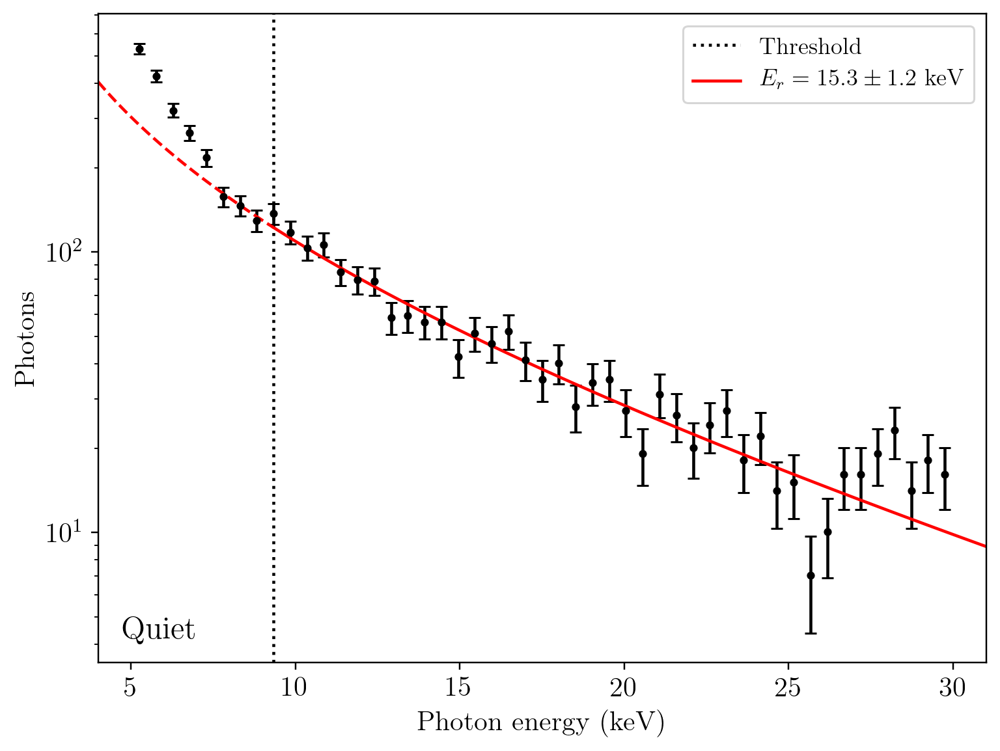

In [898]:
x = energies
y = counts/resp(energies*1000)
yerr = np.sqrt(y)

plt.errorbar(x, y, yerr=yerr, marker='o', ms=3, capsize=3, linestyle='None', color='black')
plt.yscale('log')
plt.xlabel('Photon energy (keV)')
plt.ylabel('Photons')
plt.xlim([4, 31]);

n_start = 8
popt, cov = sp.optimize.curve_fit(emiss_temp, x[n_start:], y[n_start:], p0=[1e4, 10.0], sigma=yerr[n_start:])
plt.axvline(x=x[n_start], linestyle=':', color='black', label='Threshold')

en = np.linspace(x[n_start], 31, num=100)
plt.plot(en, emiss_temp(en, *popt), color='red', label=r'$E_r = {0:.1f} \pm {1:.1f}$ keV'.format(popt[1], np.sqrt(cov[1,1])))
en = np.linspace(4, x[n_start], num=100)
plt.plot(en, emiss_temp(en, *popt), color='red', linestyle='--')

plt.legend()
plt.xlim([4, 31])
text(0.07, 0.05, 'Quiet', plt.gca(), fontsize=16);

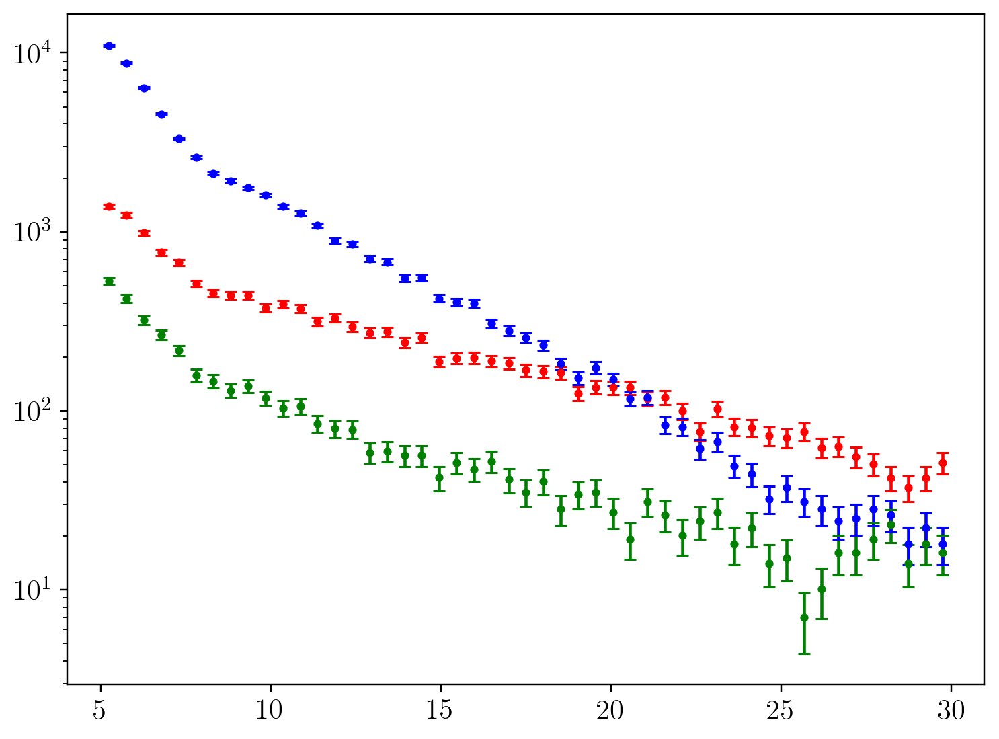

In [751]:
# Plot all three spectra at once
bins = np.linspace(fxr_threshold,30, num=50)
energies = np.array([(bins[index]+bins[index+1])/2 for index in range(len(bins)-1)])

counts_rise, _ = np.histogram(photons_rise, bins=bins)
counts_quiet, _ = np.histogram(photons_quiet, bins=bins)
counts_flat, _ = np.histogram(photons_flat, bins=bins)

x = energies
yr = counts_rise / resp(energies*1000)
yrerr = np.sqrt(yr)
plt.errorbar(x, yr, yerr=yrerr, marker='o', ms=3, capsize=3, linestyle='None', color='red')

yq = counts_quiet / resp(energies*1000)
yqerr = np.sqrt(yq)
plt.errorbar(x, yq, yerr=yqerr, marker='o', ms=3, capsize=3, linestyle='None', color='green')

yf = counts_flat / resp(energies*1000)
yferr = np.sqrt(yf)
plt.errorbar(x, yf, yerr=yferr, marker='o', ms=3, capsize=3, linestyle='None', color='blue')

plt.yscale('log')

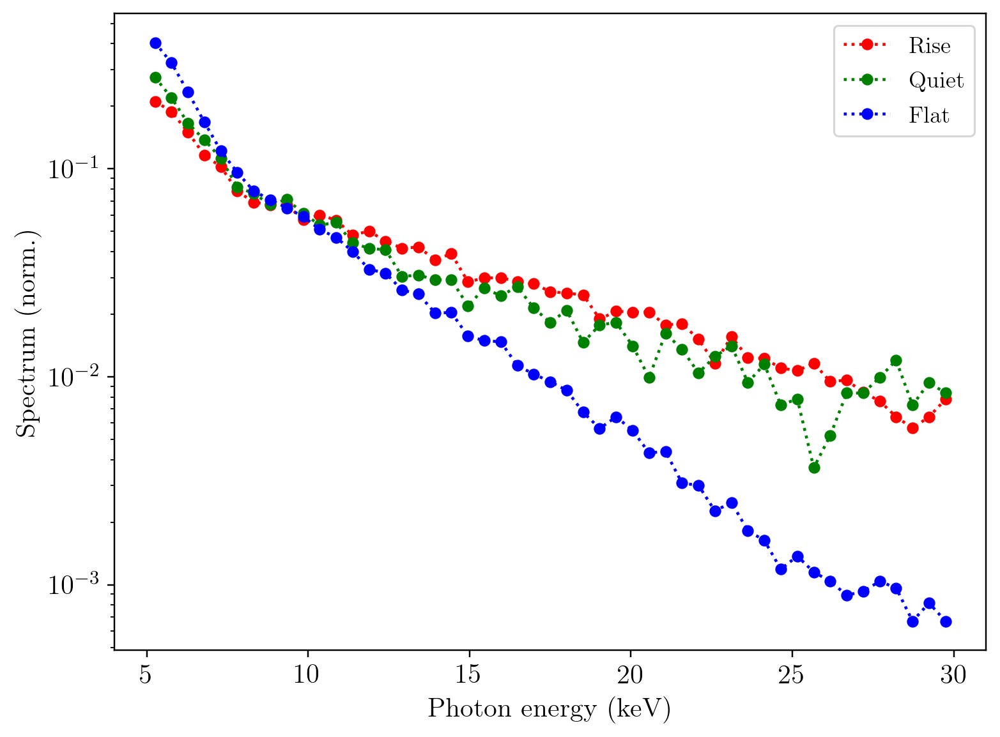

In [874]:
# Plot all three spectra at once
bins = np.linspace(fxr_threshold,30, num=50)
energies = np.array([(bins[index]+bins[index+1])/2 for index in range(len(bins)-1)])

counts_rise, _ = np.histogram(photons_rise, bins=bins, density=True)
counts_quiet, _ = np.histogram(photons_quiet, bins=bins, density=True)
counts_flat, _ = np.histogram(photons_flat, bins=bins, density=True)

x = energies
yr = counts_rise / resp(energies*1000)
yq = counts_quiet / resp(energies*1000)
yf = counts_flat / resp(energies*1000)

plt.plot(x, yr, marker='o', ms=5, linestyle=':', color='red', label='Rise')
plt.plot(x, yq, marker='o', ms=5, linestyle=':', color='green', label='Quiet')
plt.plot(x, yf, marker='o', ms=5, linestyle=':', color='blue', label='Flat')

plt.yscale('log')
plt.legend()
plt.xlabel('Photon energy (keV)')
plt.ylabel('Spectrum (norm.)')
plt.xlim([4, 31]);

## Comparison with a $\kappa$ distribution

For the Kappa distribution, recall:

$$
    \varepsilon_\kappa(E;T_e,\kappa) = C_{\kappa} \cdot \sqrt{T_e} \int_0^\infty \frac{g_{ff}(y,w)}{(1 + \frac{y+w}{\kappa - 3/2})^{\kappa+1}}
$$

where $w = E/T_e$ and $y$ is a dummy integration variable. Again assuming a constant $g_{ff}$, the expression simplifies significantly:

$$
    \varepsilon_\kappa(E;T_e,\kappa) = C_{\kappa} \cdot \bar{g}_{ff} \sqrt{T_e} \cdot \bigg(\frac{\kappa - 3/2}{\kappa} \bigg) \cdot \bigg(\frac{E/T_e}{\kappa - 3/2} + 1 \bigg)^{-\kappa}.
$$

Also to get units of photons we will want to further divide this by energy.

In [771]:
def emiss_kappa(en, Te=1000, kappa=4, Ck=1e8):
    return Ck * np.sqrt(Te) * ((kappa - 1.5) / kappa) * ((en/Te/(kappa - 1.5)) + 1)**(-kappa) / en

def emiss_maxwell(en, Te=1000, Cm=1e19):
    return Cm * np.exp(-en/Te) / np.sqrt(Te) / en

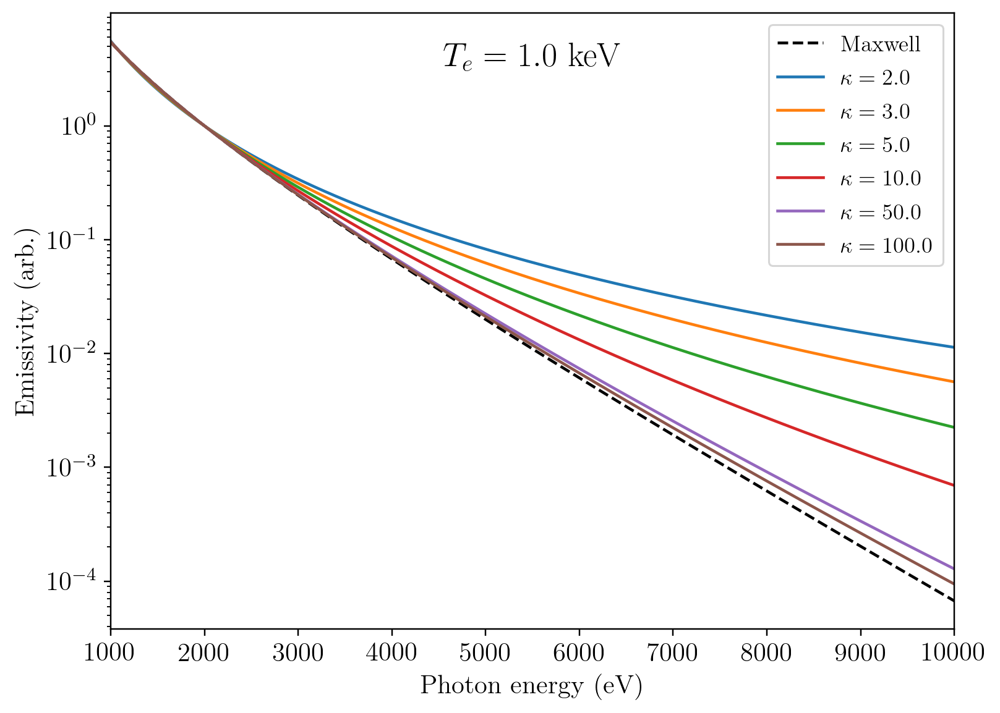

In [764]:
Te = 1000
en = np.linspace(1000, 10000, num=10000)
n = np.argmin(np.abs(en - 2000))

eps_m = emiss_maxwell(en, Te=Te)
plt.semilogy(en, eps_m/eps_m[n], color='black', linestyle='dashed', label='Maxwell')

for kappa in [2.0, 3.0, 5.0, 10.0, 50.0, 100.0]:
    eps_k = emiss_kappa(en, kappa=kappa, Te=Te)
    plt.semilogy(en, eps_k / eps_k[n], label=r'$\kappa = {0:.1f}$'.format(kappa))
    
plt.legend()
plt.xlim([1000, 10000])
plt.xlabel('Photon energy (eV)')
plt.ylabel('Emissivity (arb.)')
text(0.5, 0.92, '$T_e = {0:.1f}$ keV'.format(Te/1000), plt.gca(), fontsize=18);

/home/pdvanmeter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in power
  


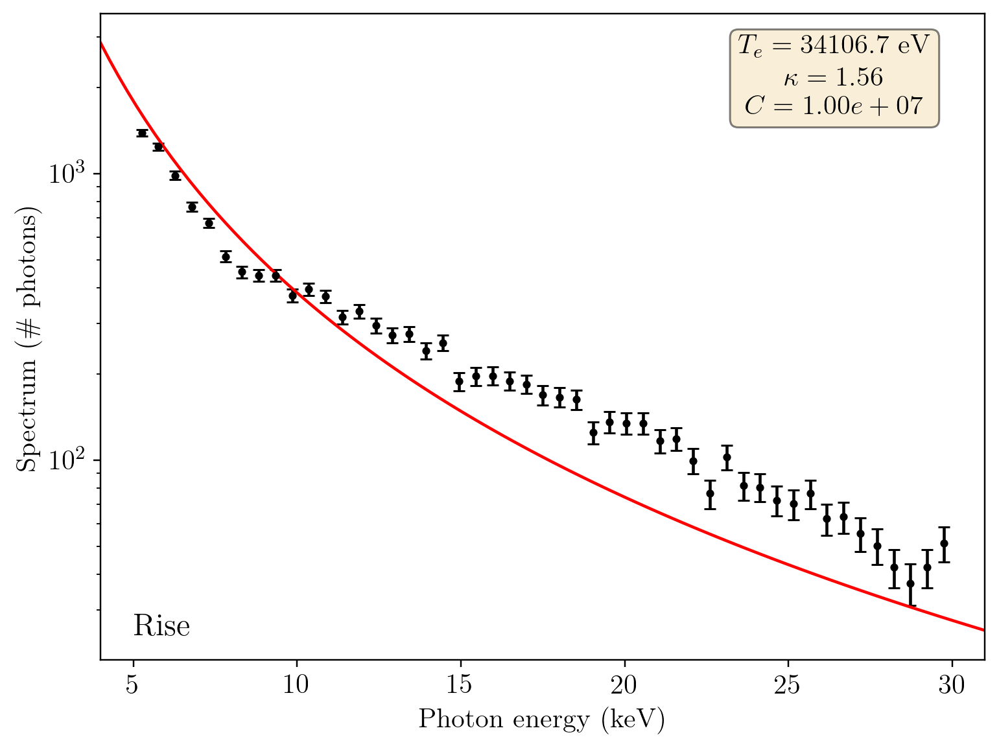

In [822]:
counts_rise, _ = np.histogram(photons_rise, bins=bins)
x = energies
yr = counts_rise / resp(energies*1000)
yrerr = np.sqrt(yr)

plt.errorbar(x, yr, yerr=yrerr, marker='o', ms=3, capsize=3, linestyle='None', color='black')
plt.yscale('log')

# Try the fit
p0 = [800., 5., 1e8]
bounds = [
    [1e2,  0.6, 1e7],
    [1e5, 100., 1e12]
]
popt, cov = sp.optimize.curve_fit(emiss_kappa, x*1000., yr, sigma=yrerr, p0=p0, bounds=bounds)
en = np.linspace(4,31,num=100)
plt.plot(en, emiss_kappa(en*1000., *popt), color='red')

textstr = '\n'.join((
    r'$T_e = {0:.1f}$ eV'.format(popt[0]),
    r'$\kappa = {0:.2f}$'.format(popt[1]),
    r'$C = {0:1.2e}$'.format(popt[2])
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

text(0.83, 0.9, textstr, plt.gca(), bbox=props, fontsize=14)
plt.xlabel('Photon energy (keV)')
plt.ylabel('Spectrum (\# photons)')
plt.xlim([4, 31])
text(0.07, 0.05, 'Rise', plt.gca(), fontsize=16);

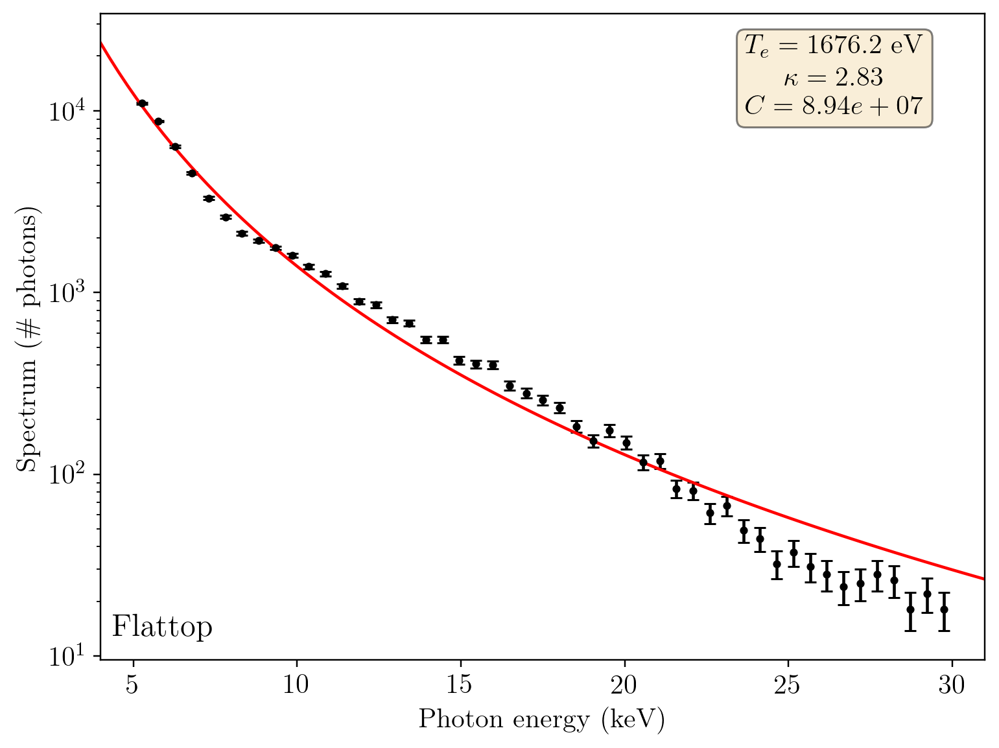

In [877]:
counts_flat, _ = np.histogram(photons_flat, bins=bins)
x = energies
yf = counts_flat / resp(energies*1000)
yferr = np.sqrt(yf)

plt.errorbar(x, yf, yerr=yferr, marker='o', ms=3, capsize=3, linestyle='None', color='black')
plt.yscale('log')

# Try the fit
p0 = [800., 5., 1e9]
bounds = [
    [200.,  1., 1e7],
    [2000., 100., 1e10]
]
popt, cov = sp.optimize.curve_fit(emiss_kappa, x*1000., yf, sigma=yferr, p0=p0, bounds=bounds)
en = np.linspace(4,31,num=100)
plt.plot(en, emiss_kappa(en*1000., *popt), color='red')

textstr = '\n'.join((
    r'$T_e = {0:.1f}$ eV'.format(popt[0]),
    r'$\kappa = {0:.2f}$'.format(popt[1]),
    r'$C = {0:1.2e}$'.format(popt[2])
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

text(0.83, 0.9, textstr, plt.gca(), bbox=props, fontsize=14)
plt.xlabel('Photon energy (keV)')
plt.ylabel('Spectrum (\# photons)')
plt.xlim([4, 31])
text(0.07, 0.05, 'Flattop', plt.gca(), fontsize=16);

## Does the density show any evolution at the end of the quiet phase?

In [899]:
shot = 1200701056
t_start = 8.0
t_end = 55.0
delta_t = 0.1

fir_data, fir_radius, fir_time = get_fir_signals(shot)

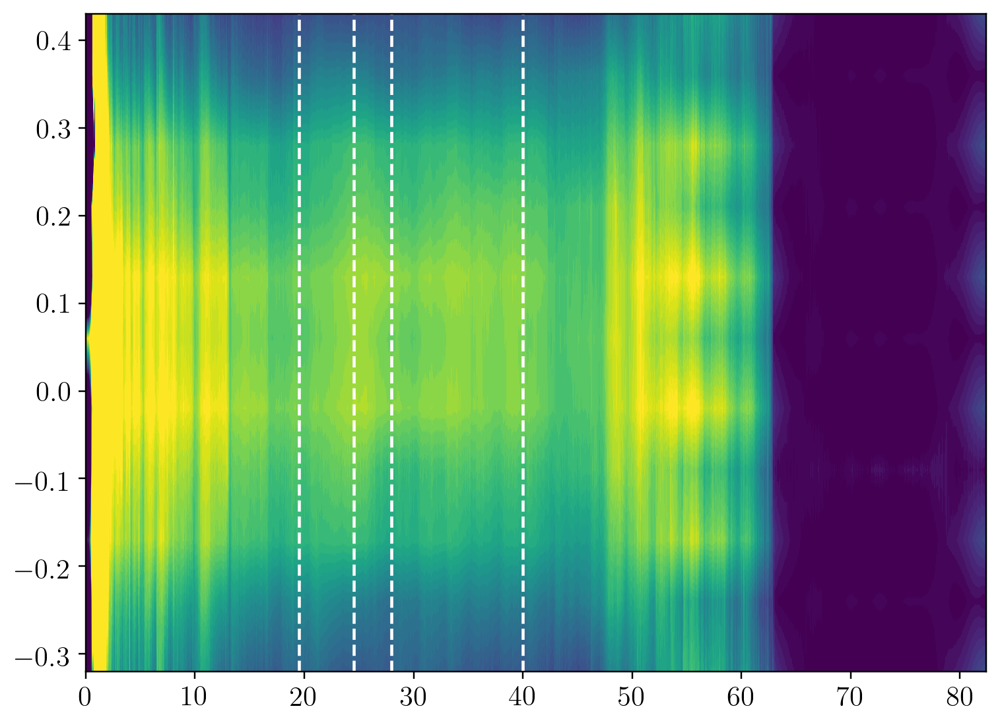

In [902]:
plt.contourf(fir_time, fir_radius, fir_data, 500, vmin=0, vmax=0.5)

# Highlight the regions
rise_start = 19.5
rise_end = 24.5
quiet_end = 28.0
flat_end = 40.0

plt.axvline(x=rise_start, color='white', linestyle='dashed')
plt.axvline(x=rise_end, color='white', linestyle='dashed')
plt.axvline(x=quiet_end, color='white', linestyle='dashed')
plt.axvline(x=flat_end, color='white', linestyle='dashed');

## Comparison with Bremsstrahlung emission

I think synchrotron emission is over-complicating the matter for the moment. Let's 

In [845]:
dens = 1.0e13 # cm^-3
temp = 700. # eV
ln_lambda = 24.0 - np.log(np.sqrt(dens)/temp)

In [852]:
eps0 = 8.854187e-12 # F / m
eV_to_J = 1.602e-19 # J / eV
me = 9.109383e-31 # kg
c_light = 3e8
qe = 1.602e-19 # C

ne = 1.0e19 # m^-3
Te = 800. # eV
vth = np.sqrt(Te*eV_to_J / me) # m / s

E_D = 1 / (4*np.pi*eps0**2)
E_D *= ne * (qe**3) * ln_lambda
E_D /= me * (vth**2) # V / m
E_c = E_D * Te*eV_to_J / (me * c_light**2) # V / m

In [906]:
ln_lambda

15.584277230582108

In [853]:
E_c

0.007932964026246828